# Pipeline for AGEP column

Enable auto-reloading of external modules

In [27]:
import pandas as pd
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Import dependencies

In [28]:
from pprint import pprint

from utils.data_loader import *
from utils.null_handler import *
from utils.EDA_utils import *
from utils.simple_utils import *
from utils.model_tuning_utils import *
from utils.stability_analysis import *
from utils.analysis_helper import *
from config import *

import os
import warnings
warnings.filterwarnings('ignore')
os.environ["PYTHONWARNINGS"] = "ignore"

plt.style.use('mpl20')
matplotlib.rcParams['figure.dpi'] = 100
matplotlib.rcParams.update({'font.size': 10})

In [29]:
try:
    from folktables import ACSDataSource, ACSEmployment
except:
    !pip install folktables
    from folktables import ACSDataSource, ACSEmployment

## Loading ACSEmployment data

In [30]:
TARGET_COLUMN = 'AGEP'
NULL_SCENARIO_NAME = f'Unknown_{TARGET_COLUMN}'
COLUMN_TYPE = get_column_type(TARGET_COLUMN)

In [31]:
X_data, y_data = ACSDataLoader(task=DATASET_CONFIG['task'], state=DATASET_CONFIG['state'], year=DATASET_CONFIG['year'], without_nulls=True)

Original: 24 mb
Optimized: 12 mb

Dataset shape before handling nulls:  (196967, 16)
Impute values:  {'SCHL': 0, 'ESP': 0, 'MIG': 0, 'MIL': 0, 'DREM': 0}
Dataset shape after handling nulls:  (196967, 16)

Rechecking if there are nulls in X_data:
AGEP        0
SCHL        0
MAR         0
RELP        0
DIS         0
ESP         0
CIT         0
MIG         0
MIL         0
ANC         0
NATIVITY    0
DEAR        0
DEYE        0
DREM        0
SEX         0
RAC1P       0
dtype: int64


In [59]:
y_data.value_counts()

0    105498
1     91469
Name: ESR, dtype: int64

## Tune hyper-parameters and find the best model

### The best model for a baseline dataset (no nulls)

In [32]:
ML_baseline_results_df = pd.read_csv(os.path.join('..', 'results', 'ML_baseline_results_df.csv'))
ML_baseline_results_df

,Unnamed: 0,Dataset_Name,Model_Name,F1_Score,Accuracy_Score,Model_Best_Params
0,0,Folktables [NY 2018],LogisticRegression,0.7998,0.7999,"{'max_iter': 100, 'penalty': 'l2', 'solver': '..."
1,1,Folktables [NY 2018],DecisionTreeClassifier,0.8229,0.8230,"{'criterion': 'entropy', 'max_depth': 10, 'max..."
2,2,Folktables [NY 2018],XGBClassifier,0.8296,0.8297,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti..."


### Find the best model for a drop-column dataset (with nulls)

In [33]:
# import time
# start = time.time()

In [34]:
# # TODO: tune XGBoost just for one pipeline, not for all. Avoid Xgboost for other pipelines to reduce time
#
# # Copy datasets for tuning to avoid confusion with datasets for imputations
# baseline_X_data, baseline_y_data = X_data.copy(deep=True), y_data.copy(deep=True)
# baseline_X_data.drop(columns=[TARGET_COLUMN], axis=1, inplace=True)
# baseline_X_train_features, baseline_y_train, baseline_X_test_features, baseline_y_test = preprocess_dataset(X_data, y_data)
#
# ML_drop_column_results_df = test_models(baseline_X_train_features, baseline_y_train, baseline_X_test_features, baseline_y_test)
# ML_drop_column_results_df

In [35]:
# for index, row in ML_drop_column_results_df.iterrows():
#     print(f'\n\nModel name: {row["Model_Name"]}')
#     pprint(row['Model_Best_Params'])

In [36]:
# ML_drop_column_results_df.to_csv(os.path.join('..', 'results', NULL_SCENARIO_NAME, f'{NULL_SCENARIO_NAME}_ML_drop_column_results_df.csv'),
#                                  sep=",", columns=ML_drop_column_results_df.columns, float_format="%.4f")

In [37]:
# end = time.time()
# print('Model tuning time: ', end - start)

## Simulate Null Scenarios

In [38]:
corrupted_data = simulate_scenario(X_data, SIMULATED_SCENARIOS_DICT[NULL_SCENARIO_NAME])

## Impute Nulls

Check correctness of conditional techniques

In [39]:
mapping_dict = check_conditional_techniques(corrupted_data, TARGET_COLUMN)
pprint(mapping_dict)

{'RAC1P': {'RAC1P-1': (2267, 'AGEP-60.0'),
           'RAC1P-2': (431, 'AGEP-19.0'),
           'RAC1P-3': (15, 'AGEP-17.0'),
           'RAC1P-4': (1, 'AGEP-27.0'),
           'RAC1P-5': (10, 'AGEP-52.0'),
           'RAC1P-6': (298, 'AGEP-45.0'),
           'RAC1P-7': (7, 'AGEP-29.0'),
           'RAC1P-8': (213, 'AGEP-18.0'),
           'RAC1P-9': (143, 'AGEP-1.0')},
 'SEX': {'SEX-1': (1470, 'AGEP-19.0'), 'SEX-2': (1630, 'AGEP-60.0')}}


Impute a null scenario with all null-handling techniques

In [40]:
# TODO: use enable_plots=True just for one pipeline, but for others set False
imputed_data_dict, technique_metrics_dict = impute_df_with_all_techniques(X_data, corrupted_data,
                                                                          TARGET_COLUMN, COLUMN_TYPE, NULL_SCENARIO_NAME, enable_plots=False)
imputed_data_dict['baseline'] = X_data





 ###############  Impute AGEP column with drop-column technique  ###############




 ###############  Impute AGEP column with drop-rows technique  ###############




 ###############  Impute AGEP column with predict-by-sklearn technique  ###############
MAE for regression - AGEP: 25.8




 ###############  Impute AGEP column with kNN technique  ###############
MAE for regression - AGEP: 9.7




 ###############  Impute AGEP column with regression technique  ###############
MAE for regression - AGEP: 10.9




 ###############  Impute AGEP column with impute-by-mean technique  ###############
Impute values:  {'AGEP': 42.0}
MAE for regression - AGEP: 18.5




 ###############  Impute AGEP column with impute-by-mean-trimmed technique  ###############
Impute values:  {'AGEP': 42.0}
MAE for regression - AGEP: 18.5




 ###############  Impute AGEP column with impute-by-mean-conditional technique  ###############
Impute AGEP with value 41.0, where SEX == 1
Impute AGEP with value 43.0, w

In [41]:
print("#" * 15, " Metrics for different imputation techniques ", "#" * 15)
for technique_name in technique_metrics_dict:
    print(f'{technique_name}: {round(technique_metrics_dict[technique_name], 4)}')

###############  Metrics for different imputation techniques  ###############
kNN: 9.7068
regression: 10.8662
impute-by-mean-conditional_RAC1P: 18.3279
impute-by-mean-conditional_SEX: 18.4995
impute-by-mean: 18.5026
impute-by-mean-trimmed: 18.5026
impute-by-median: 18.5026
impute-by-median-trimmed: 18.5026
impute-by-median-conditional_RAC1P: 18.633
impute-by-median-conditional_SEX: 18.6582
predict-by-sklearn: 25.8291


## Quantifying uncertainty using posterior predictive distribution

In [42]:
matplotlib.rcParams.update({'font.size': 14})
imputation_techniques = list(imputed_data_dict.keys())
imputation_techniques

['drop-column',
 'drop-rows',
 'predict-by-sklearn',
 'kNN',
 'regression',
 'impute-by-mean',
 'impute-by-mean-trimmed',
 'impute-by-mean-conditional_SEX',
 'impute-by-mean-conditional_RAC1P',
 'impute-by-median',
 'impute-by-median-trimmed',
 'impute-by-median-conditional_SEX',
 'impute-by-median-conditional_RAC1P',
 'baseline']

### Plots notes

Notes is based on [this paper](https://www.osti.gov/servlets/purl/1527311).

**Probability mean vs Standard deviation**
* The closer a sample is to the decision boundary, the more likely that small changes in the input data or parameters will change the predicted class.
* To gain a general understanding about the relative instability of individual classifications, we calculate the absolute difference between the number of times a sample is classified as employed or not employed and call this calculation **label stability**.
* When a sample is close to the boundary of a decision surface, perturbations in the data often cause the classifiers' to label the sample differently. Identifying which samples fall into this range, allows us to measure the relative stability of an individual classification.


**Standard deviation vs Label stability and Probability mean vs Label stability**
* Shows the correlation between probability mean, standard deviation and label stability.
* Label stability is defined as the absolute difference between the number of times the sample is classified as 0 and 1.
    * If the absolute difference is large, the label is more stable
    * If the difference is exactly zero then it's extremely unstable --- equally likely to be classified as 0 or 1


**Accuracy vs Standard deviation**
* When it is given the same label with a probability of 100%, each tree's classification of a sample is a binary decision. With 100 trees, each giving 100% probability to its prediction, the calculations of mean and standard deviation can **only result in certain values.** In this case the plot should have a shape of an arc, like here:

![image](https://user-images.githubusercontent.com/42843889/180245566-2312a79d-977f-4a56-89ac-1404c807b80e.png)

* For example for KNN based on this kind of plot, we can notice that as the number of neighbors increase, the stability of the classifiers increases, so there are lower standard deviation values. The standard deviation values show less correlation to accuracy as the number of neighbors increases. The overall accuracy is also decreased suggesting that the models are underfitting the training data.


**Accuracy vs Interquartile range**
* The interquartile range provides a measure of variability as the difference between the third and first quartiles.


### Baseline technique

TODO:add colors to plots(use RACE_SEX from test_groups, add technical column to df before plotting):
* light blue color: advantaged_RACE_disadvataged_SEX
* dark blue color: advantaged_RACE_advataged_SEX
* light red color: disadvantaged_RACE_disadvataged_SEX
* dark red color: disadvantaged_RACE_advataged_SEX

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)
test_groups --  {'Race': {'values': array([1, 1, 1, ..., 1, 1, 1]), 'advantaged': 1, 'disadvantaged': 2}, 'Sex': {'values': array([1, 2, 1, ..., 1, 2, 1], dtype=int8), 'advantaged': 1, 'disadvantaged': 2}, 'Race_Sex': {'values': array(['1_1', '1_2', '1_1', ..., '1_1', '1_2', '1_1'], dtype='<U3'), 'advantaged': '1_1', 'disadvantaged': '2_2'}}


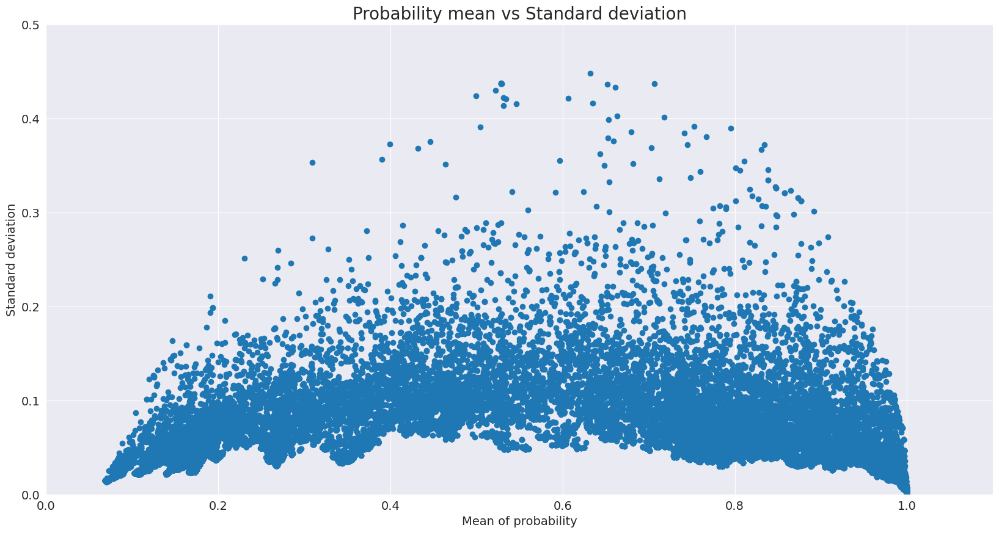

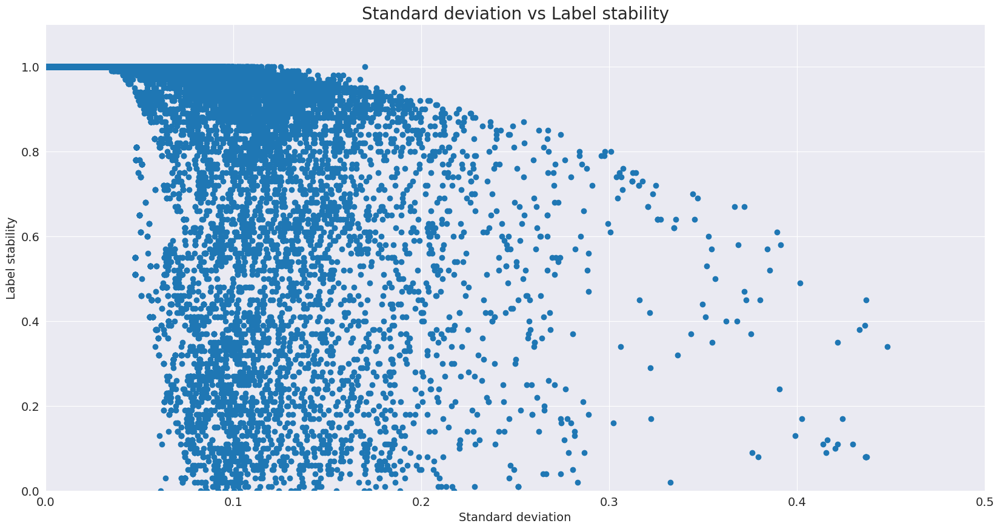

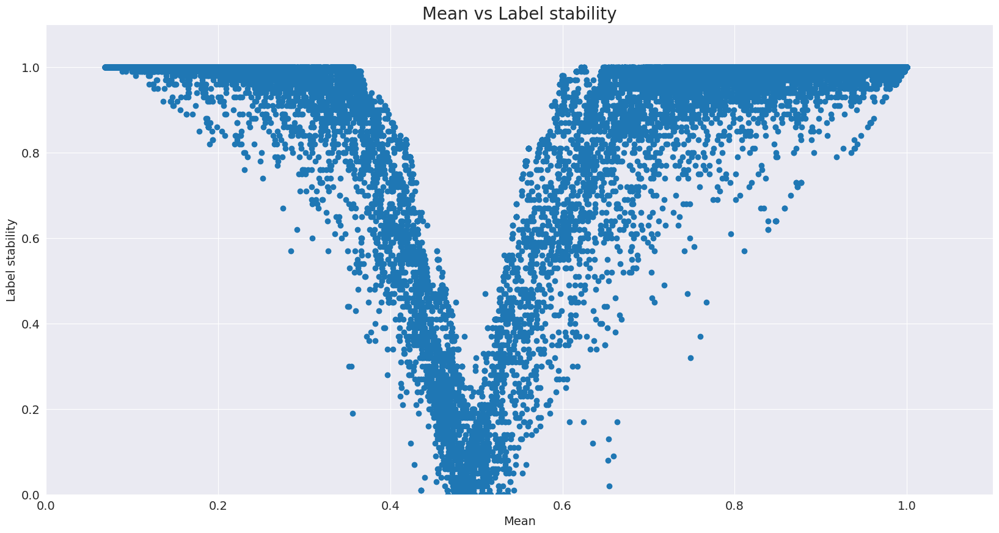

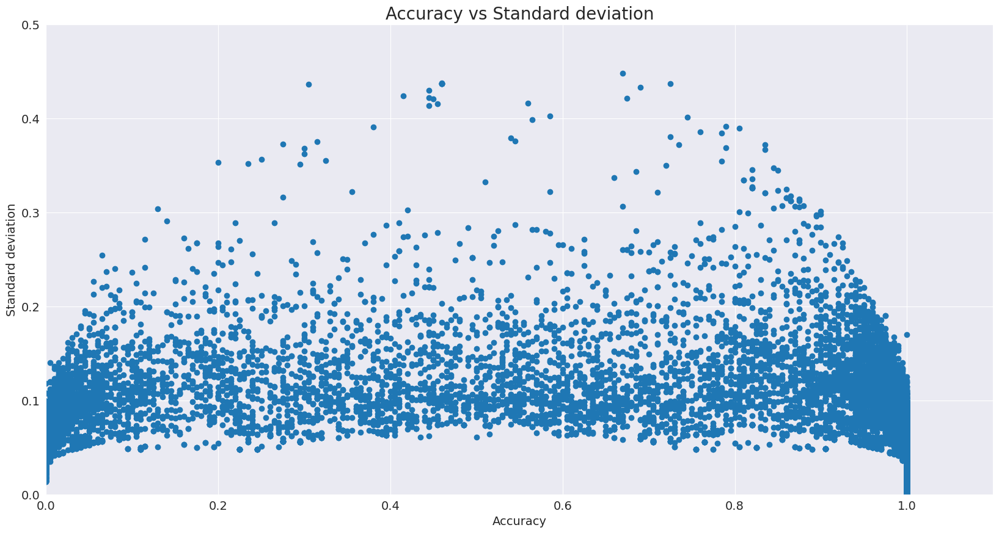

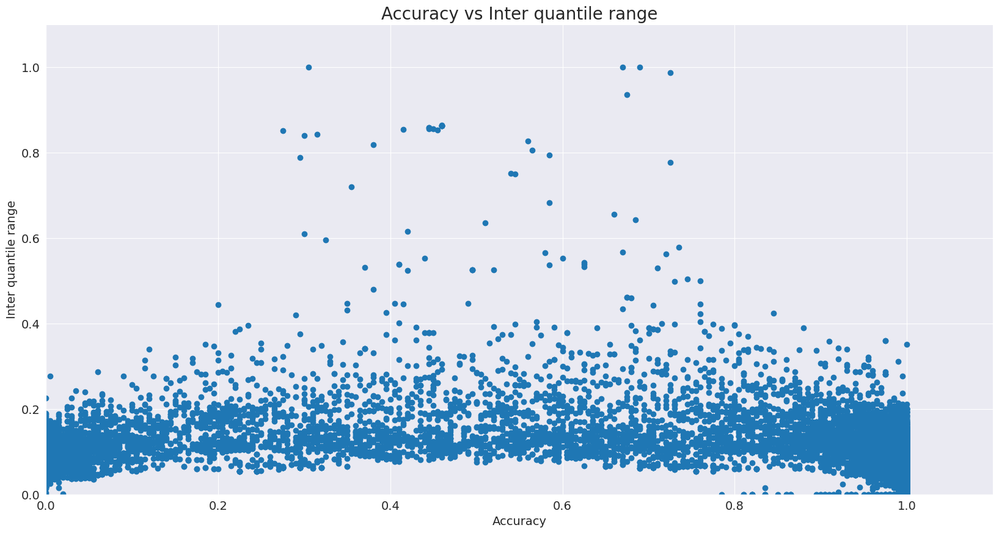

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.829319  0.845712  0.843785
disadv    0.824070  0.808696  0.804858
Accuracy  0.005249  0.037016  0.038926

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.515622  0.518212  0.521974
disadv            0.491877  0.519219  0.524696
Disparate_Impact  0.953948  1.001942  1.005216

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.863479  0.873674  0.863156
disadv             0.872480  0.869551  0.870000
Equal_Opportunity -0.009001  0.004123 -0.006844

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            1.086665  1.064191  1.036521
disadv             

In [43]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='baseline')

### Drop-column technique

X_train_imputed.shape:  (157573, 73)
X_test_imputed.shape:  (39394, 73)
test_groups --  {'Race': {'values': array([1, 8, 6, ..., 1, 2, 6]), 'advantaged': 1, 'disadvantaged': 2}, 'Sex': {'values': array([2, 1, 1, ..., 2, 2, 1], dtype=int8), 'advantaged': 1, 'disadvantaged': 2}, 'Race_Sex': {'values': array(['1_2', '8_1', '6_1', ..., '1_2', '2_2', '6_1'], dtype='<U3'), 'advantaged': '1_1', 'disadvantaged': '2_2'}}


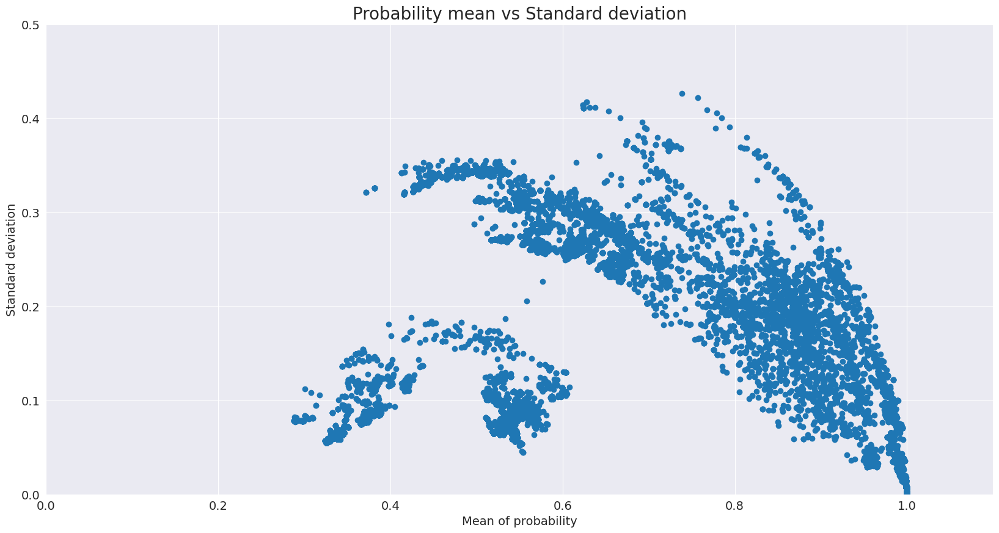

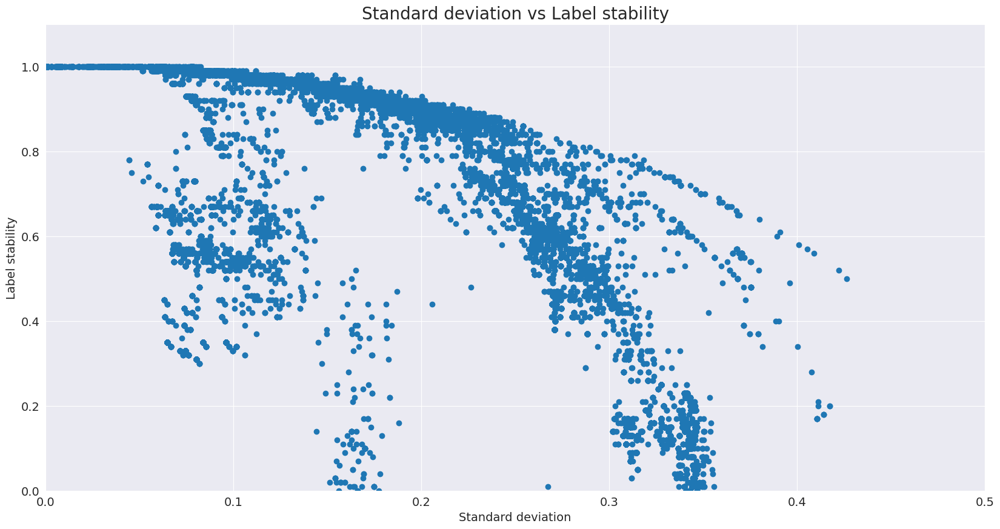

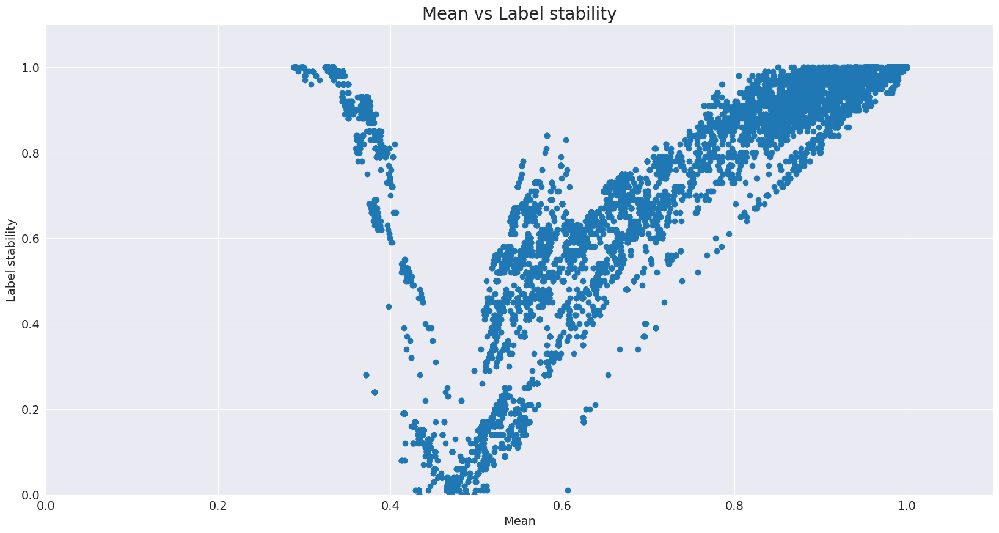

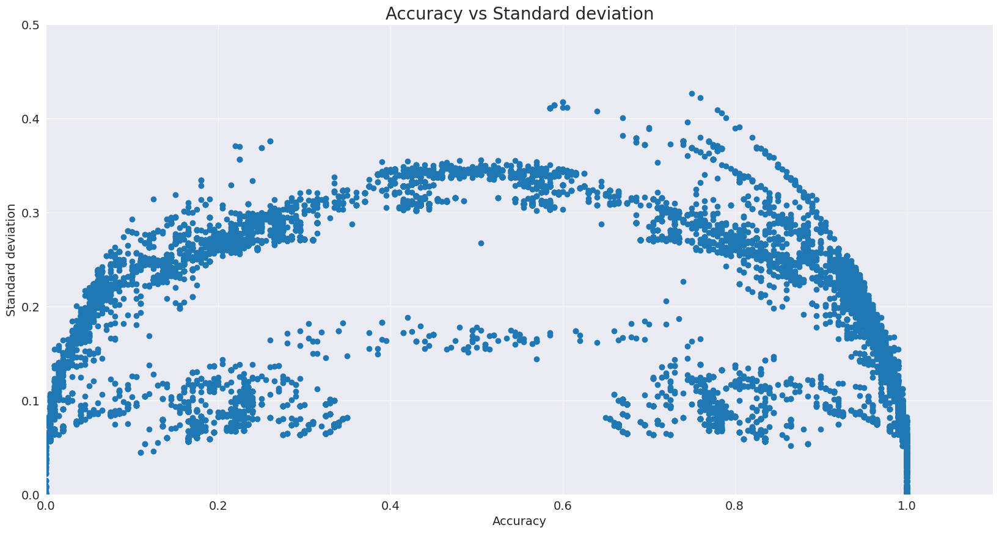

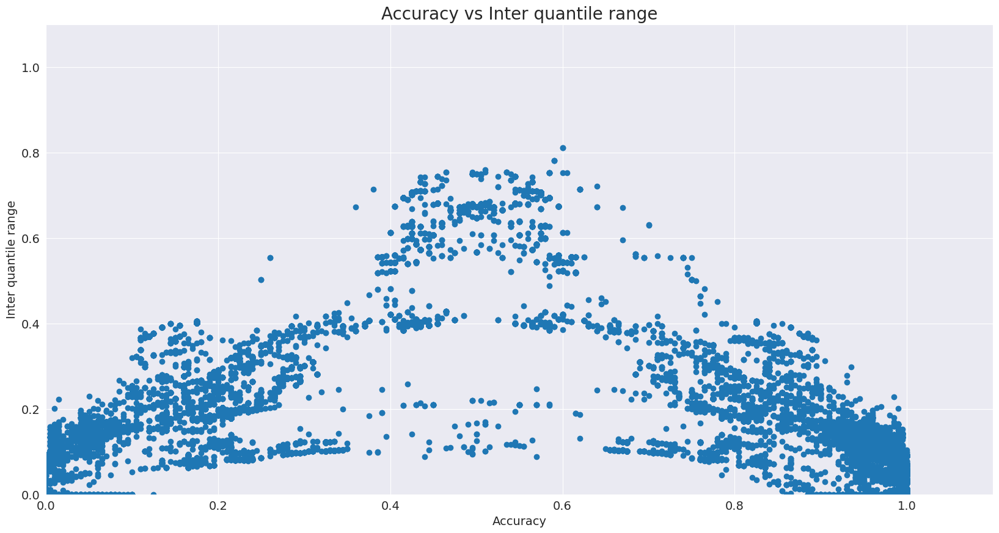

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.578582  0.638422  0.599749
disadv    0.622057  0.560566  0.563559
Accuracy -0.043475  0.077856  0.036189

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.126520  0.305947  0.258386
disadv            0.147047  0.000098  0.000770
Disparate_Impact  1.162245  0.000321  0.002982

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.187390  0.442973  0.358948
disadv             0.221891  0.000112  0.000883
Equal_Opportunity -0.034501  0.442861  0.358065

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.268237  0.627248  0.513811
disadv             

In [44]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='drop-column')

### Drop-rows technique

X_train_imputed.shape:  (155224, 74)
X_test_imputed.shape:  (38806, 74)
test_groups --  {'Race': {'values': array([1, 2, 1, ..., 1, 1, 8]), 'advantaged': 1, 'disadvantaged': 2}, 'Sex': {'values': array([1, 1, 1, ..., 1, 1, 2], dtype=int8), 'advantaged': 1, 'disadvantaged': 2}, 'Race_Sex': {'values': array(['1_1', '2_1', '1_1', ..., '1_1', '1_1', '8_2'], dtype='<U3'), 'advantaged': '1_1', 'disadvantaged': '2_2'}}


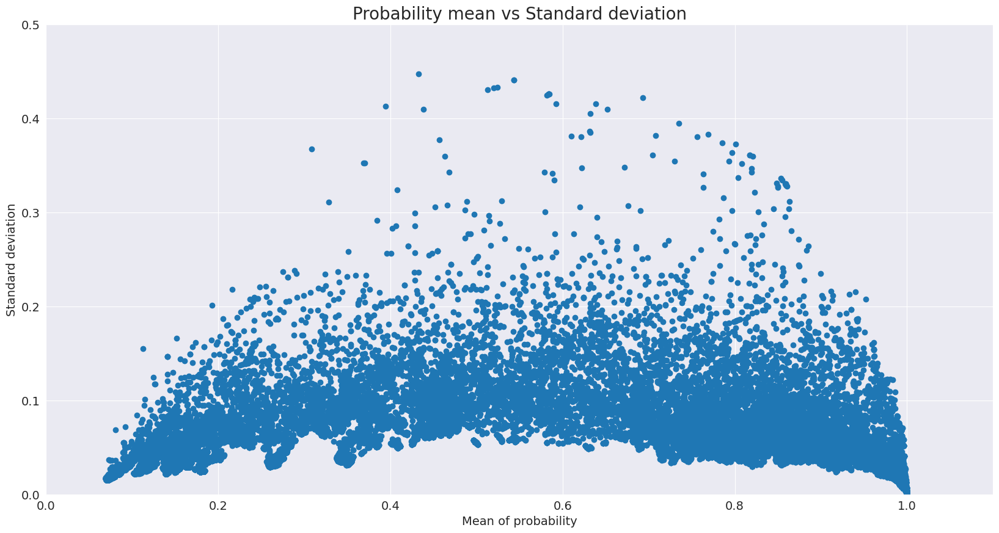

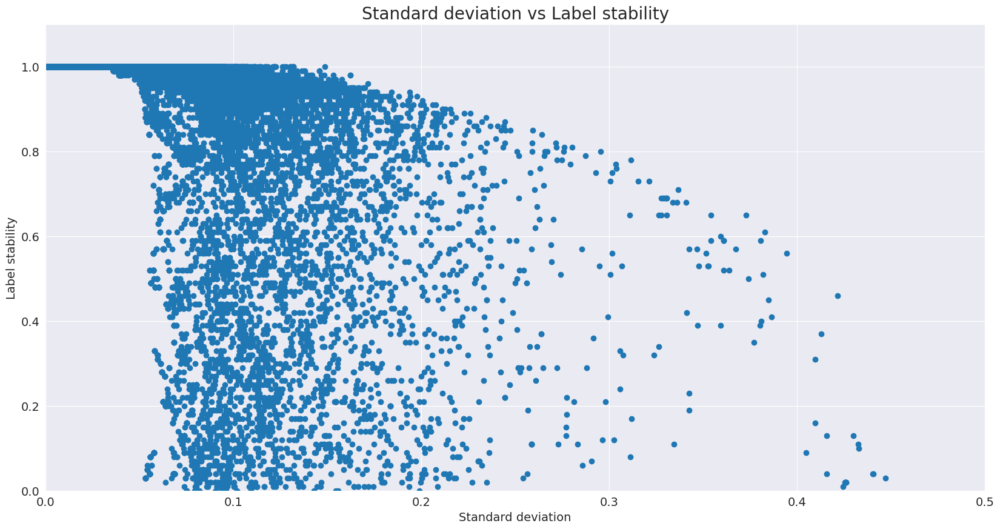

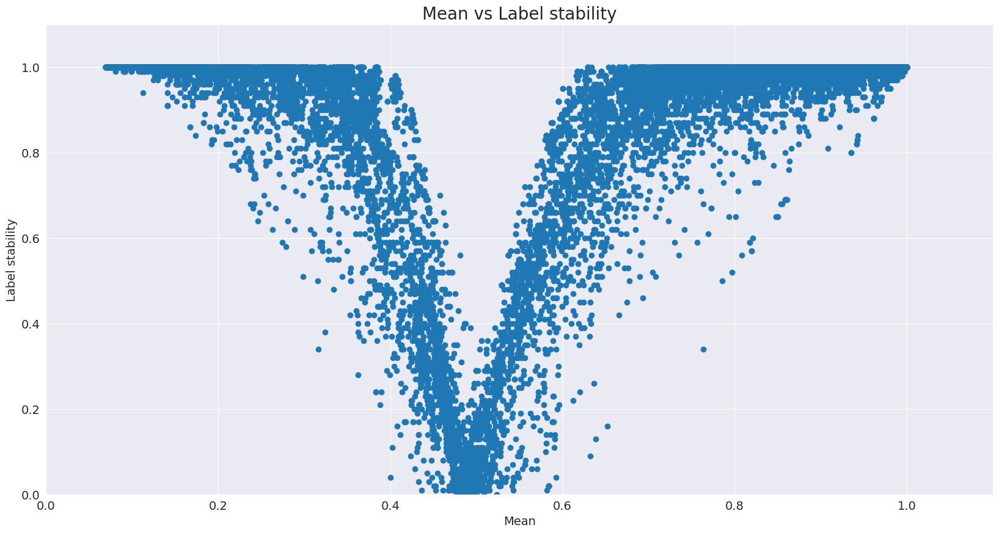

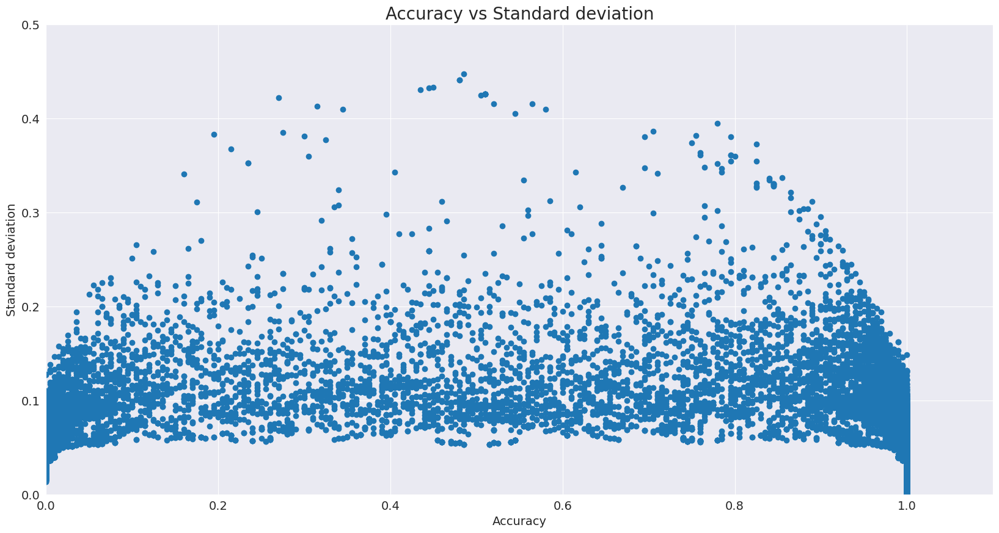

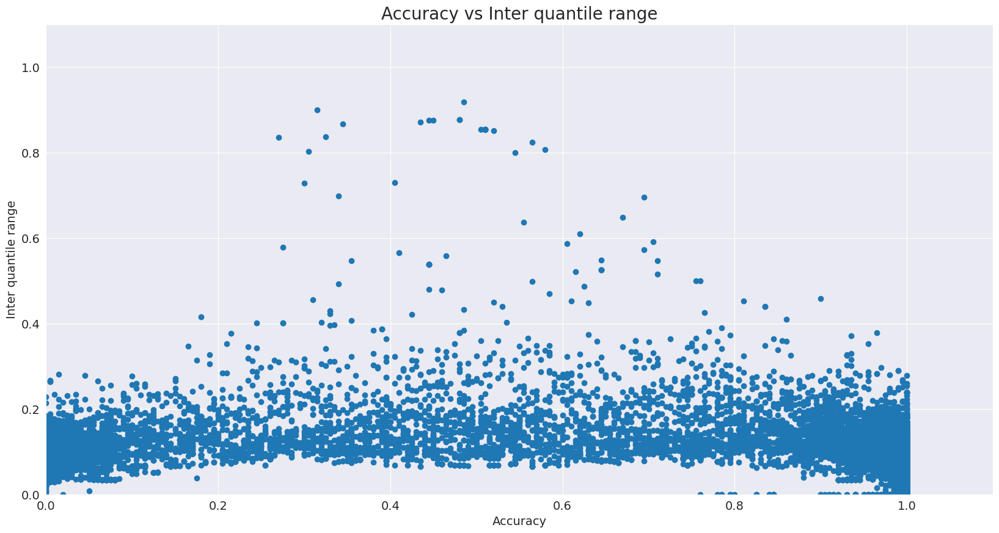

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.831709  0.846919  0.848130
disadv    0.817907  0.808180  0.803586
Accuracy  0.013802  0.038738  0.044544

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.511286  0.519536  0.519600
disadv            0.495242  0.511668  0.509562
Disparate_Impact  0.968621  0.984856  0.980681

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.863472  0.877949  0.868803
disadv             0.868260  0.861448  0.859232
Equal_Opportunity -0.004788  0.016501  0.009571

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            1.083621  1.071665  1.042235
disadv             

In [45]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='drop-rows')

### Predict-by-sklearn technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)
test_groups --  {'Race': {'values': array([1., 8., 6., ..., 1., 2., 6.]), 'advantaged': 1, 'disadvantaged': 2}, 'Sex': {'values': array([2., 1., 1., ..., 2., 2., 1.]), 'advantaged': 1, 'disadvantaged': 2}, 'Race_Sex': {'values': array(['1.0_2.0', '8.0_1.0', '6.0_1.0', ..., '1.0_2.0', '2.0_2.0',
       '6.0_1.0'], dtype='<U7'), 'advantaged': '1_1', 'disadvantaged': '2_2'}}


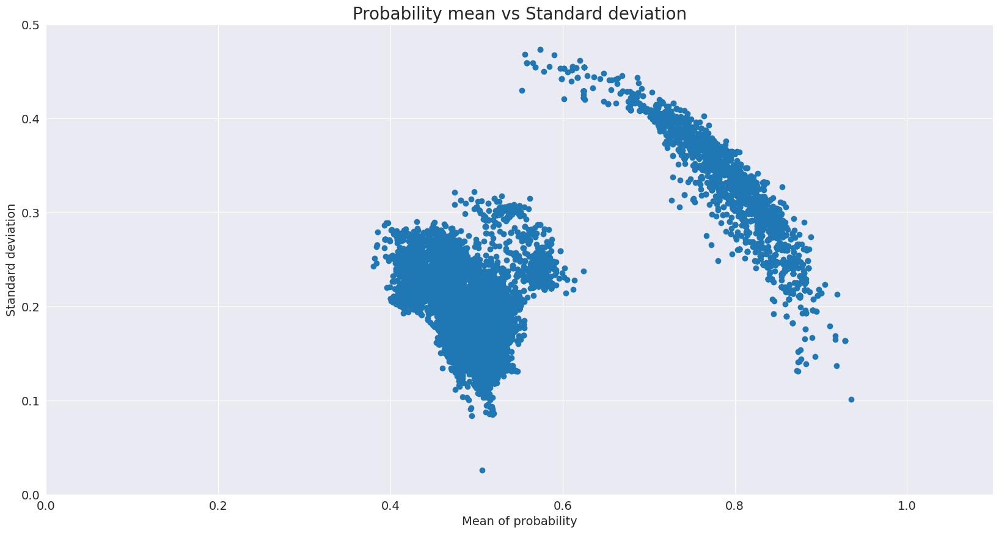

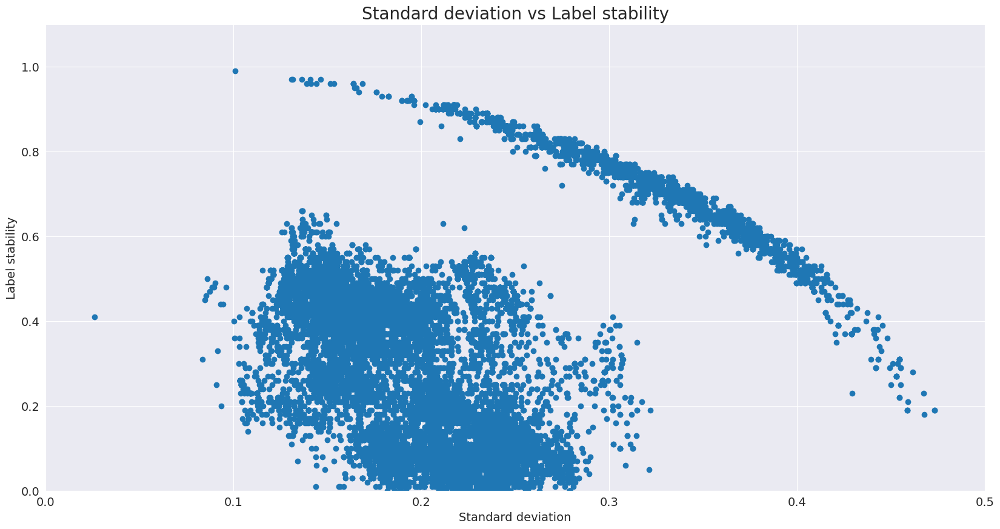

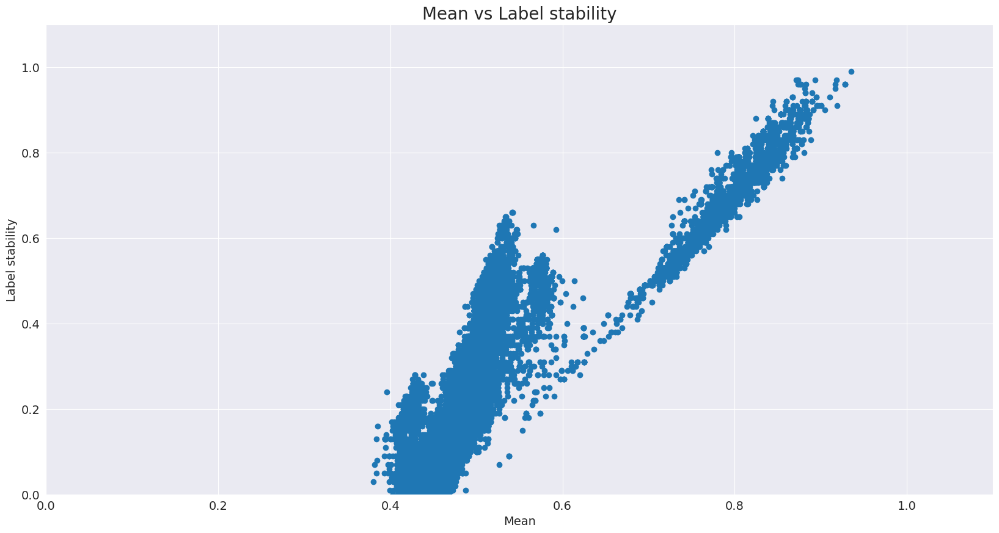

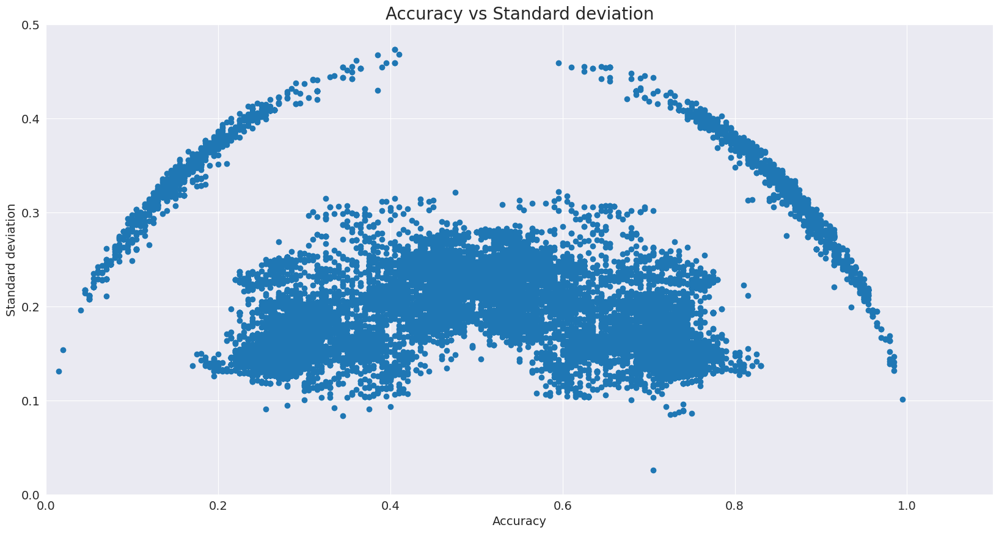

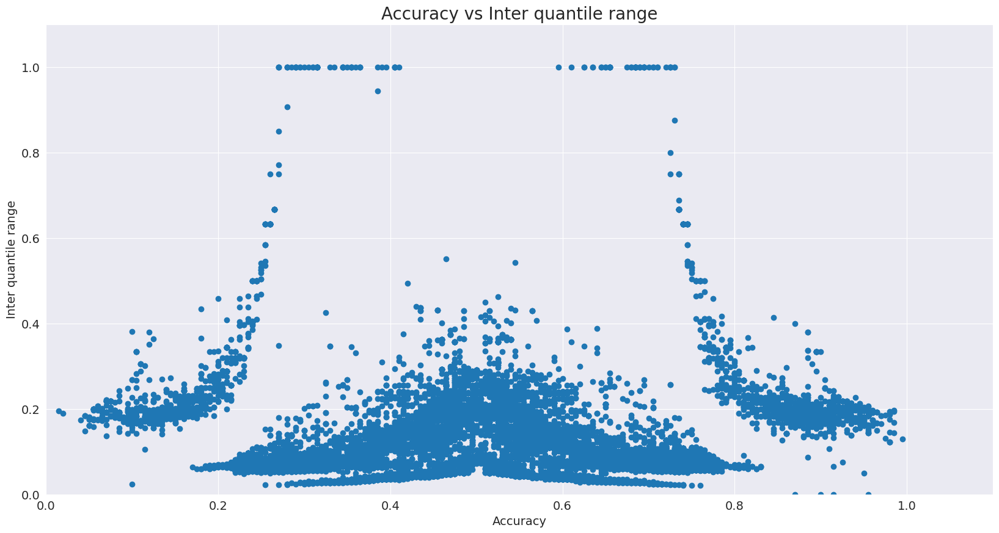

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.514001  0.511610       NaN
disadv    0.516729  0.510315       NaN
Accuracy -0.002727  0.001294       NaN

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.457959  0.517073       NaN
disadv            0.506609  0.494941       NaN
Disparate_Impact  1.106231  0.957197       NaN

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.469991  0.530799       NaN
disadv             0.525670  0.505670       NaN
Equal_Opportunity -0.055679  0.025128       NaN

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.980252  1.110447       NaN
disadv             

In [46]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='predict-by-sklearn')

### kNN imputation technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


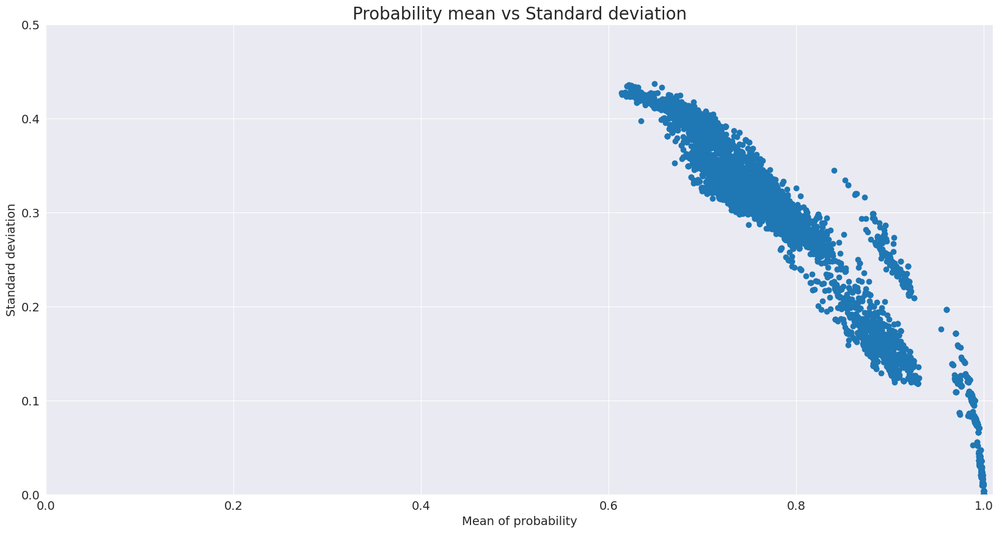

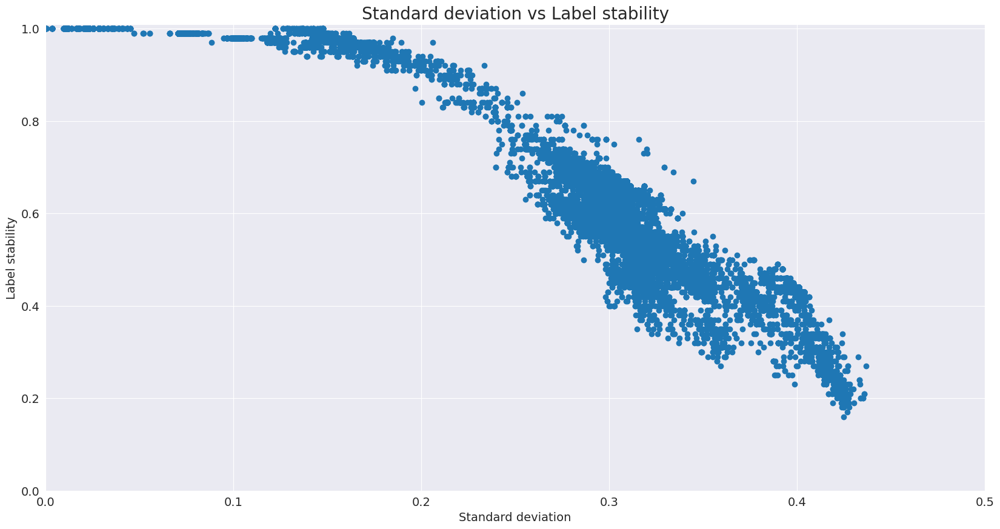

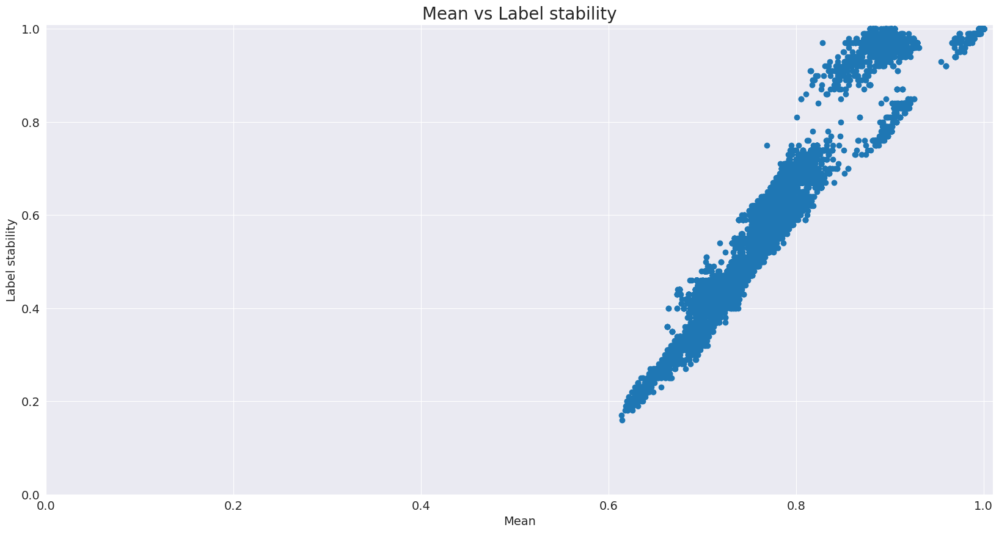

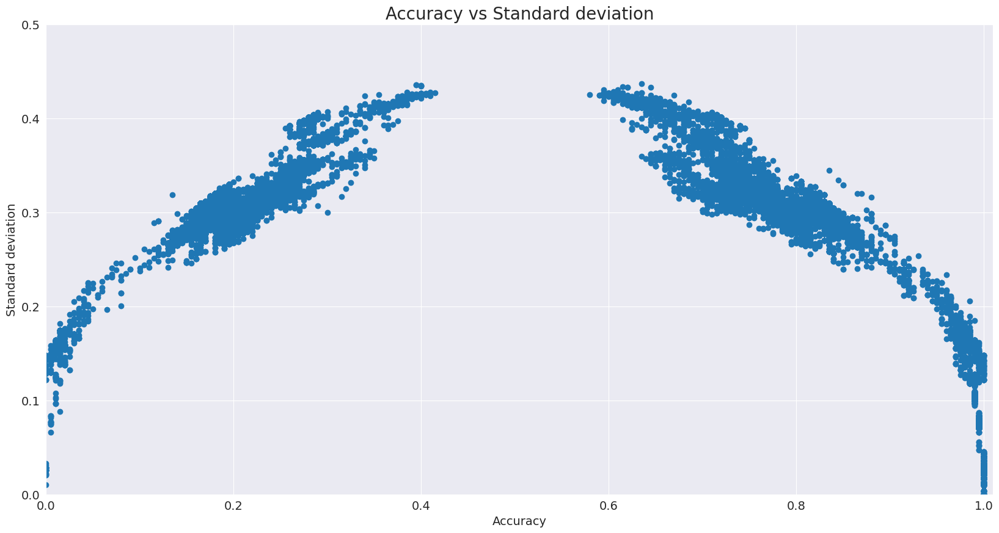

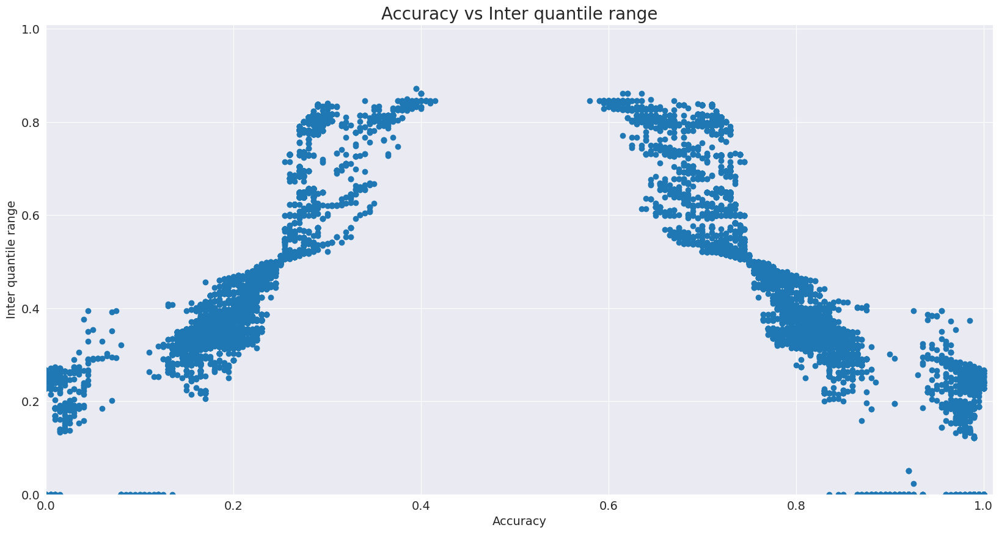

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.528329  0.512240  0.497118
disadv    0.584882  0.560566  0.563559
Accuracy -0.056554 -0.048326 -0.066441

#################### Disparate_Impact ####################
                  Race  Sex  Race_Sex
adv                0.0  0.0       0.0
disadv             0.0  0.0       0.0
Disparate_Impact   NaN  NaN       NaN

#################### Equal_Opportunity ####################
                   Race  Sex  Race_Sex
adv                 0.0  0.0       0.0
disadv              0.0  0.0       0.0
Equal_Opportunity   0.0  0.0       0.0

#################### Statistical_Parity_Difference ####################
                               Race  Sex  Race_Sex
adv                             0.0  0.0       0.0
disadv                          0.0  0.0       0.0
Statistical_Parity_Difference   0.0  0.0       0.0


In [58]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='kNN')

### Regression imputation technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)
test_groups --  {'Race': {'values': array([1, 8, 6, ..., 1, 2, 6]), 'advantaged': 1, 'disadvantaged': 2}, 'Sex': {'values': array([2, 1, 1, ..., 2, 2, 1], dtype=int8), 'advantaged': 1, 'disadvantaged': 2}, 'Race_Sex': {'values': array(['1_2', '8_1', '6_1', ..., '1_2', '2_2', '6_1'], dtype='<U3'), 'advantaged': '1_1', 'disadvantaged': '2_2'}}


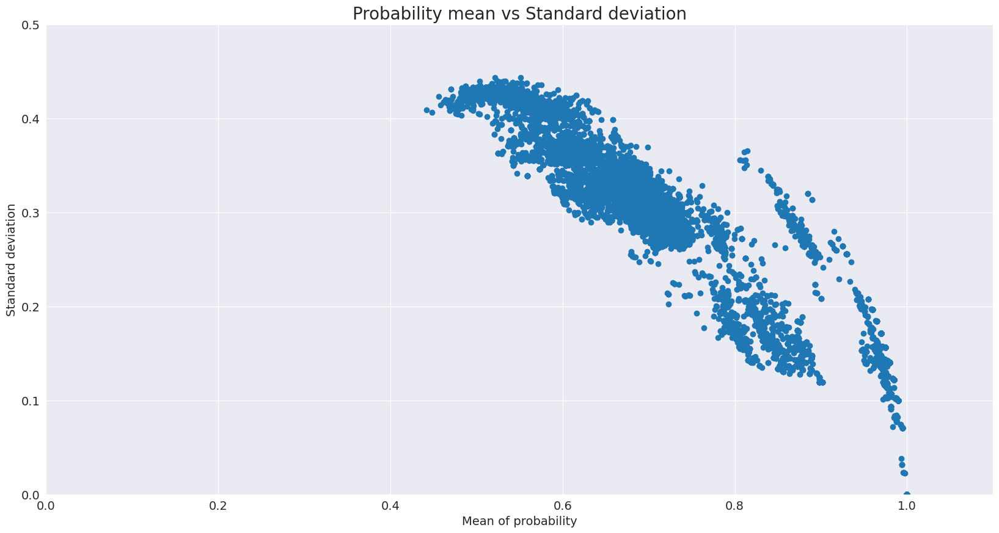

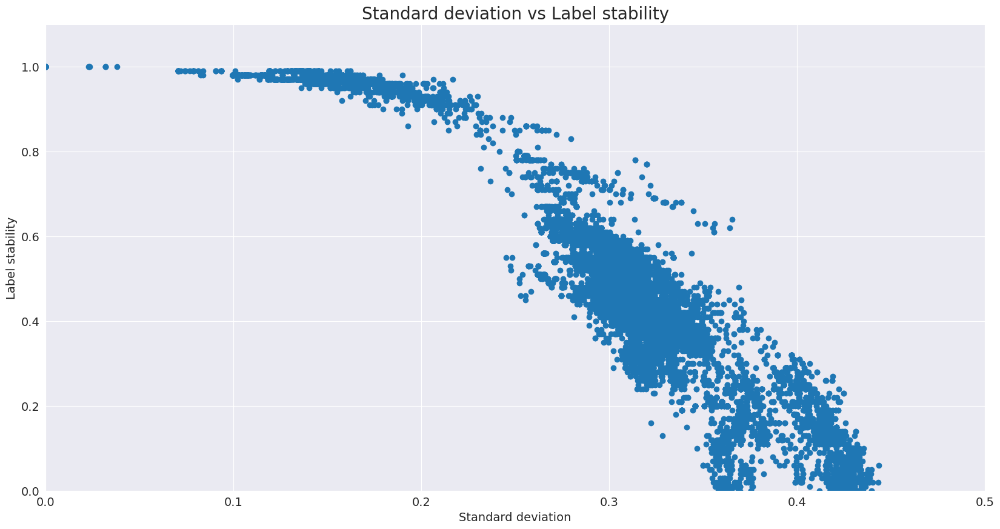

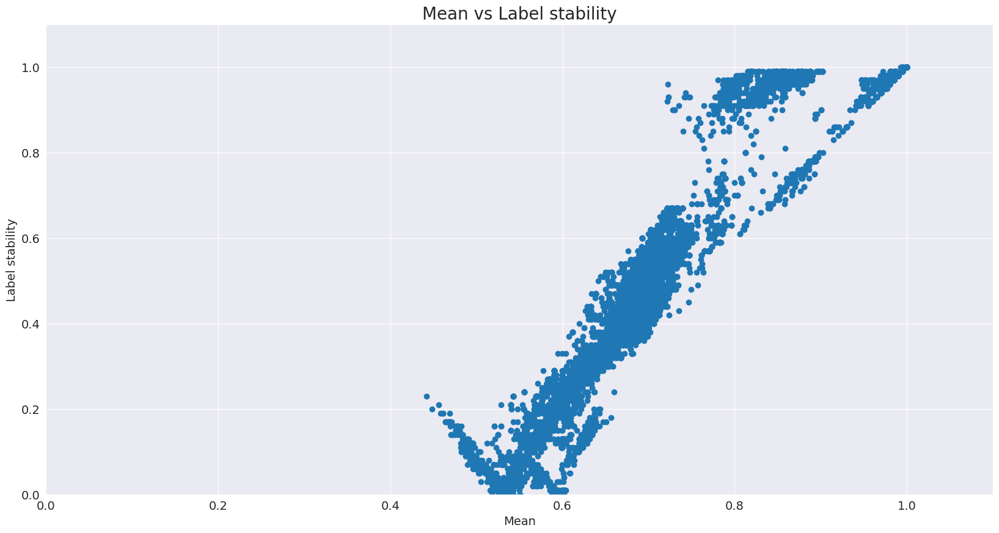

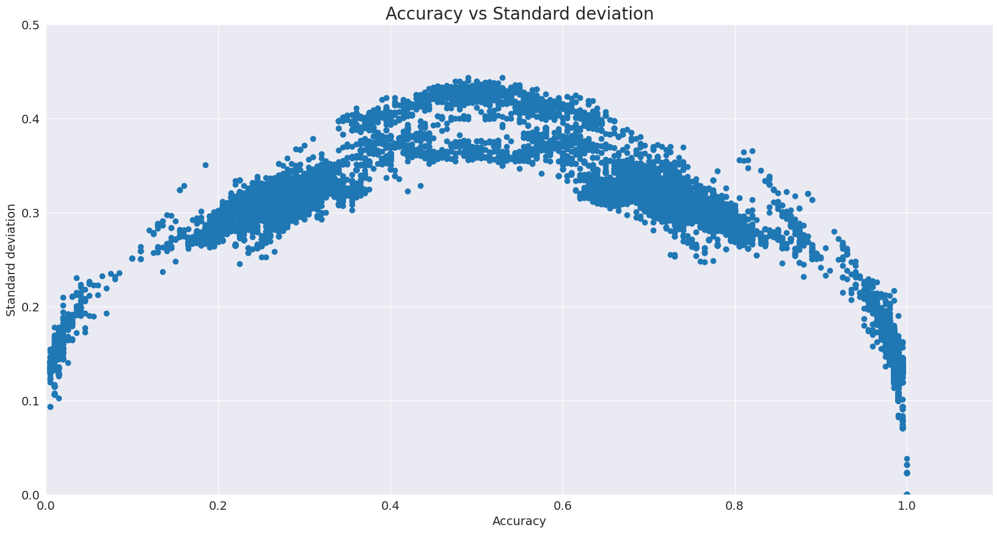

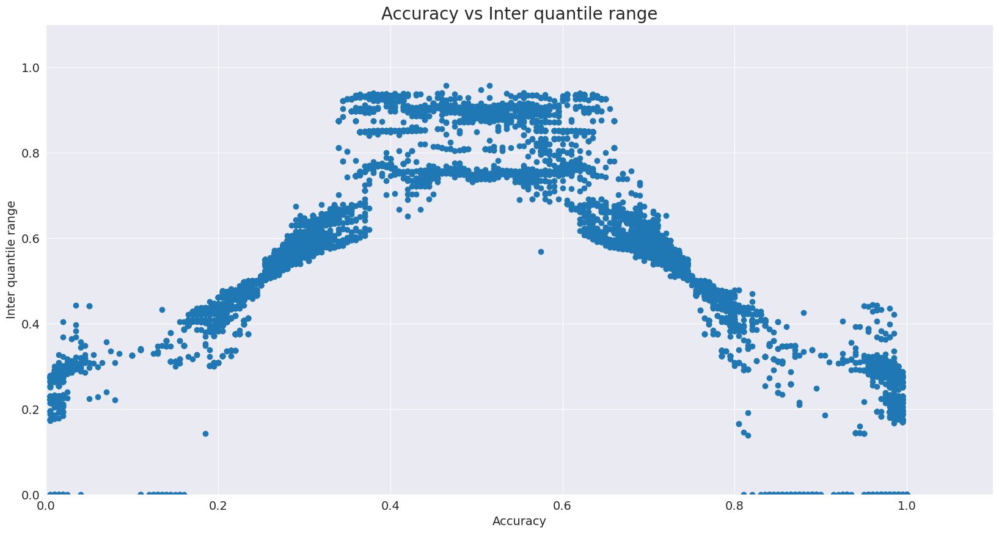

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.525145  0.509036  0.493128
disadv    0.584676  0.558748  0.563174
Accuracy -0.059531 -0.049713 -0.070046

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.008177  0.009508  0.011527
disadv            0.000207  0.004274  0.000385
Disparate_Impact  0.025258  0.449450  0.033419

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.005293  0.006462  0.007493
disadv             0.000000  0.002795  0.000000
Equal_Opportunity  0.005293  0.003667  0.007493

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.017335  0.019494  0.022921
disadv             

In [48]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='regression')

### Impute-by-mean technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)
test_groups --  {'Race': {'values': array([1, 8, 6, ..., 1, 2, 6]), 'advantaged': 1, 'disadvantaged': 2}, 'Sex': {'values': array([2, 1, 1, ..., 2, 2, 1], dtype=int8), 'advantaged': 1, 'disadvantaged': 2}, 'Race_Sex': {'values': array(['1_2', '8_1', '6_1', ..., '1_2', '2_2', '6_1'], dtype='<U3'), 'advantaged': '1_1', 'disadvantaged': '2_2'}}


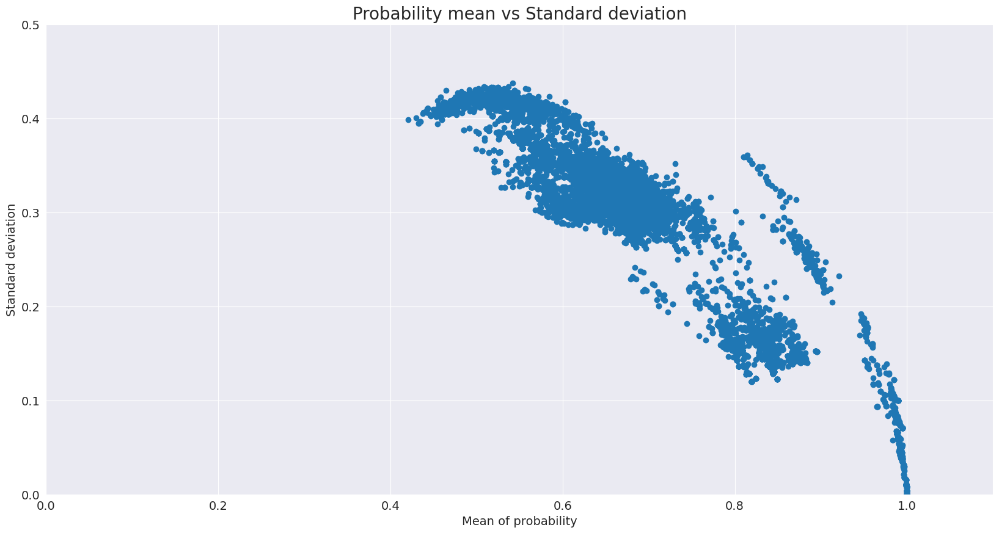

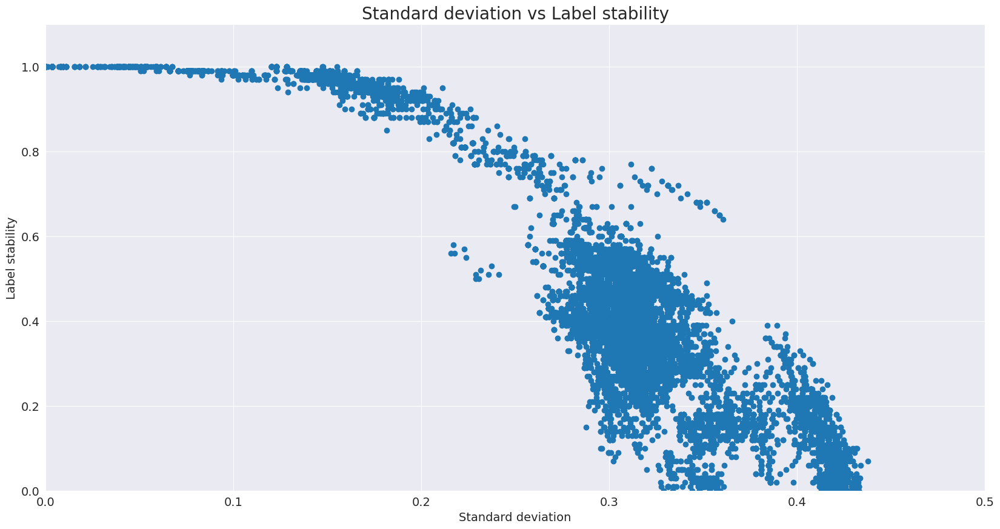

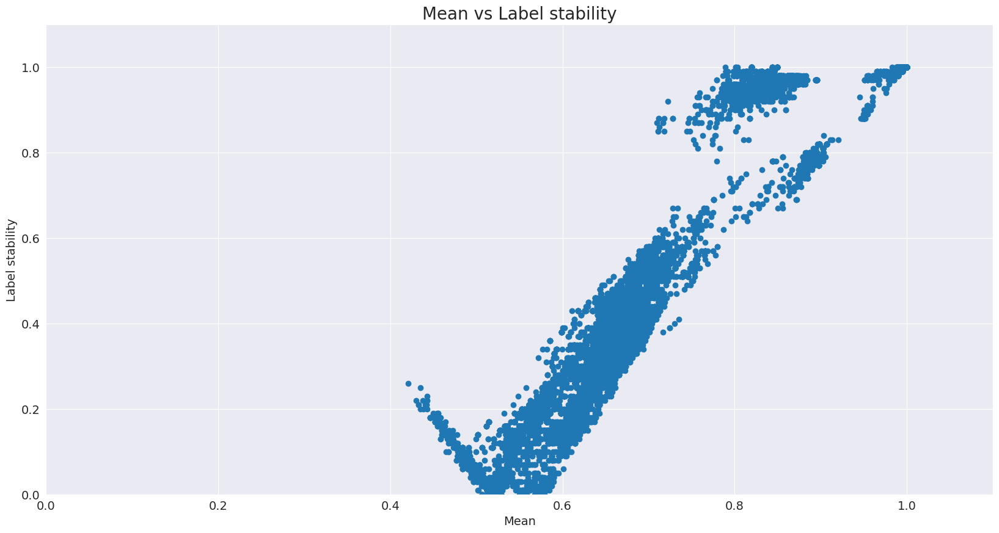

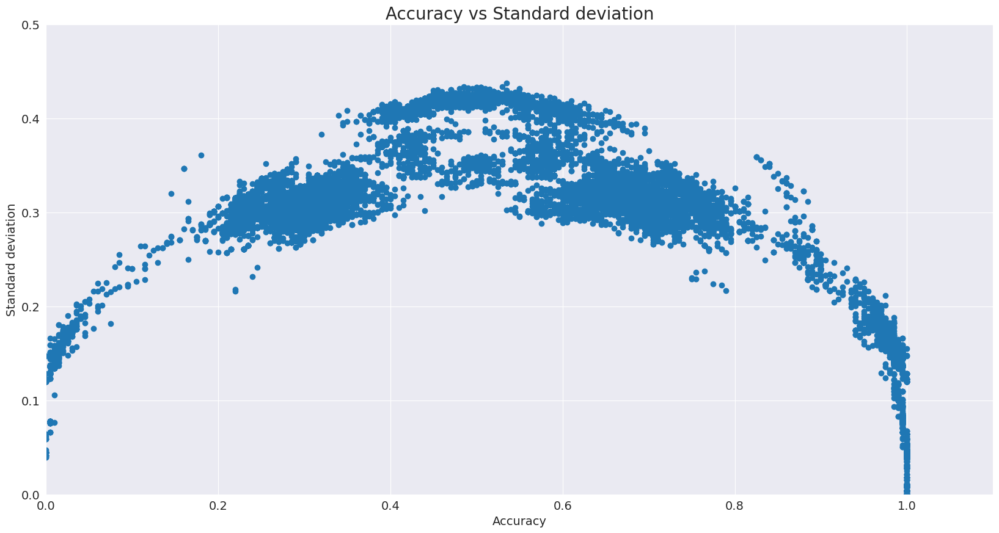

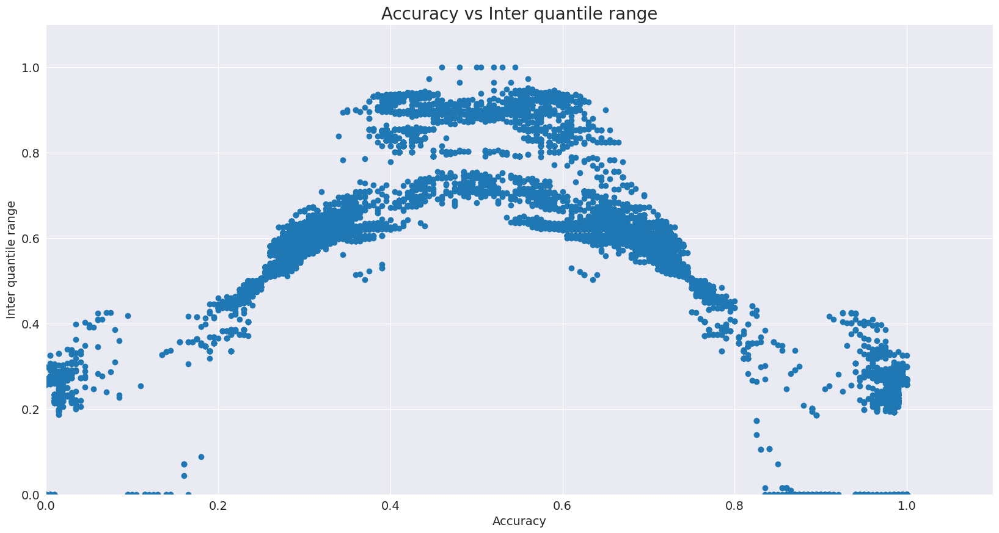

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.521671  0.504675  0.487217
disadv    0.584263  0.557570  0.562789
Accuracy -0.062591 -0.052894 -0.075572

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.015847  0.019227  0.024679
disadv            0.001033  0.006730  0.001541
Disparate_Impact  0.065164  0.350010  0.062436

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.009742  0.011955  0.014693
disadv             0.000498  0.004248  0.000883
Equal_Opportunity  0.009244  0.007707  0.013810

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.033597  0.039418  0.049074
disadv             

In [49]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-mean')

### Impute-by-mean-trimmed technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)
test_groups --  {'Race': {'values': array([1, 8, 6, ..., 1, 2, 6]), 'advantaged': 1, 'disadvantaged': 2}, 'Sex': {'values': array([2, 1, 1, ..., 2, 2, 1], dtype=int8), 'advantaged': 1, 'disadvantaged': 2}, 'Race_Sex': {'values': array(['1_2', '8_1', '6_1', ..., '1_2', '2_2', '6_1'], dtype='<U3'), 'advantaged': '1_1', 'disadvantaged': '2_2'}}


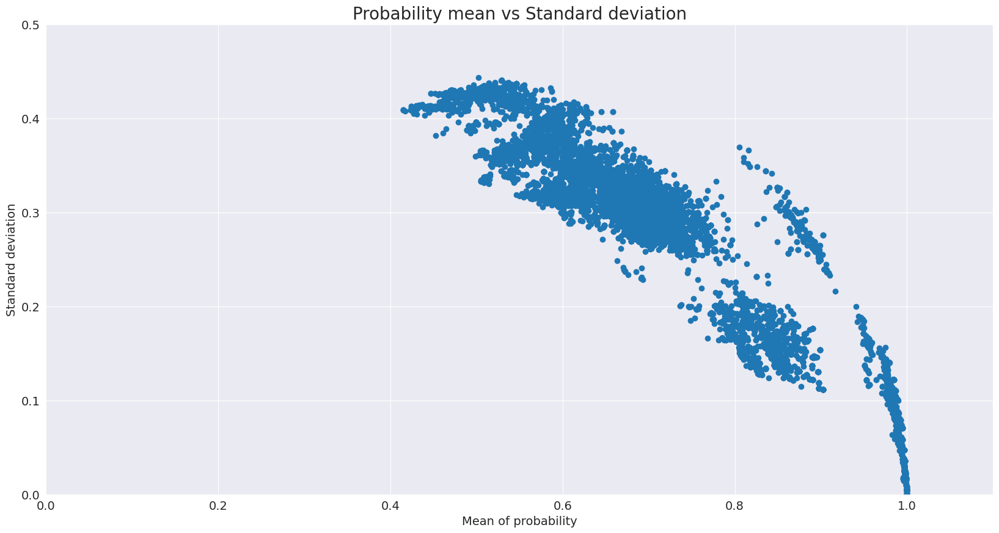

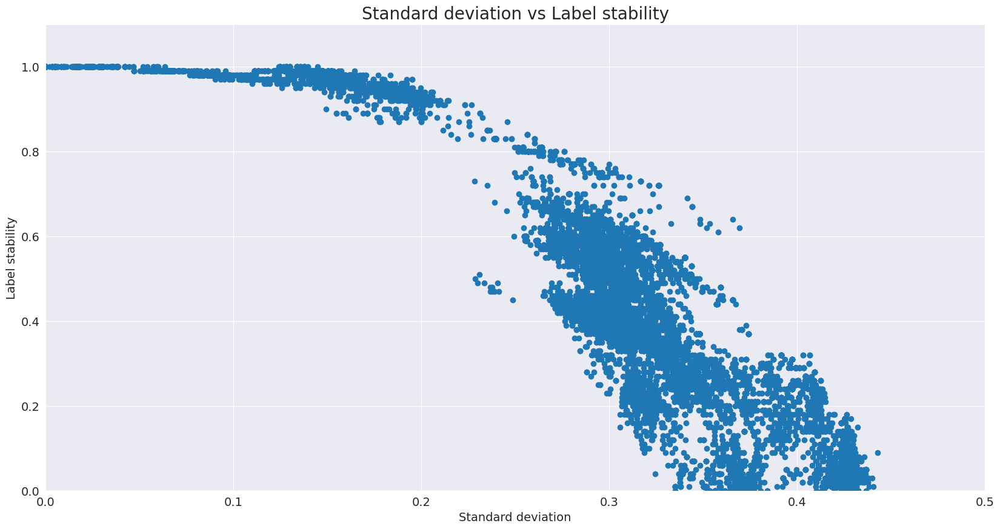

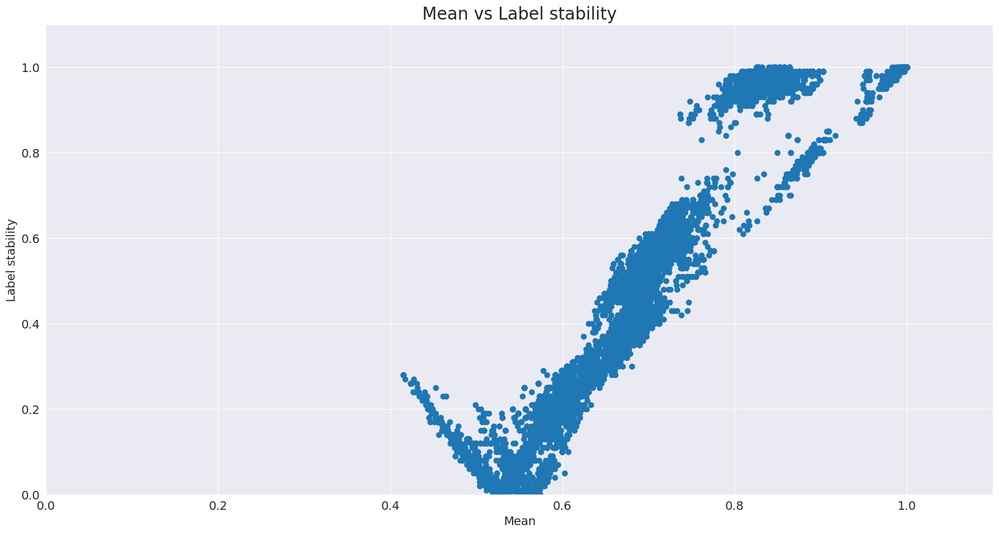

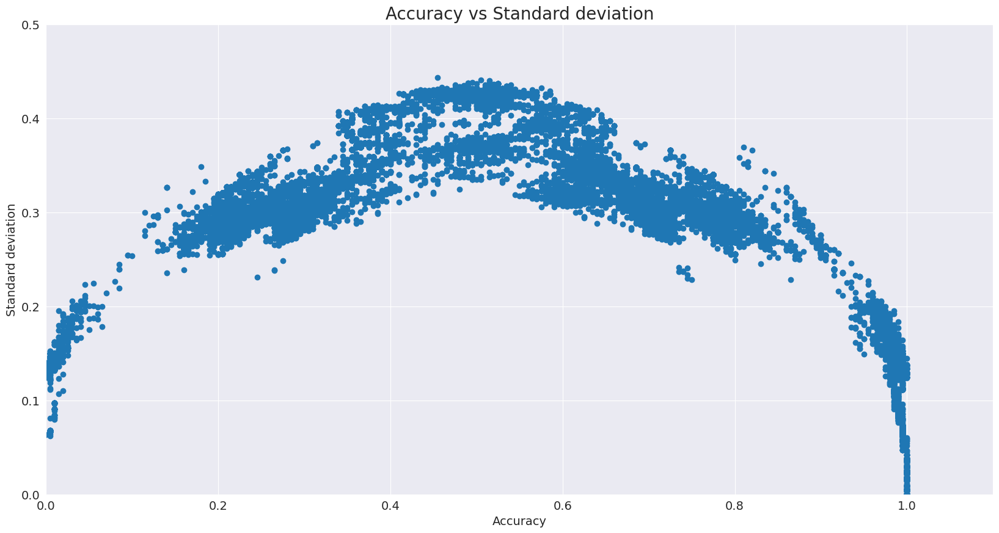

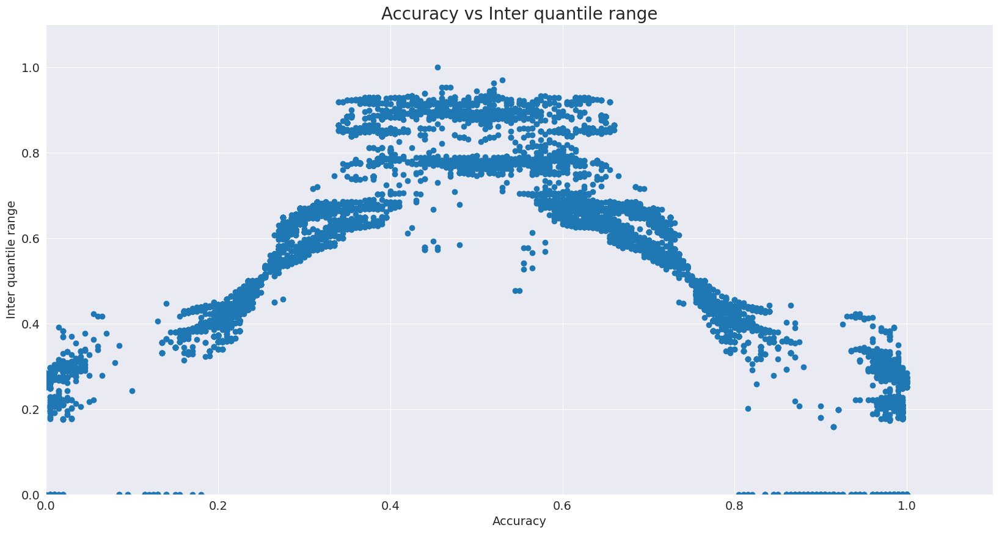

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.520116  0.504570  0.487291
disadv    0.583643  0.555163  0.561633
Accuracy -0.063527 -0.050592 -0.074342

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.019067  0.019227  0.024014
disadv            0.003304  0.012378  0.004237
Disparate_Impact  0.173310  0.643813  0.176454

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.011506  0.011847  0.014105
disadv             0.002488  0.007937  0.002648
Equal_Opportunity  0.009018  0.003911  0.011457

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.040423  0.039418  0.047752
disadv             

In [50]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-mean-trimmed')

### Impute-by-mean-conditional_SEX technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


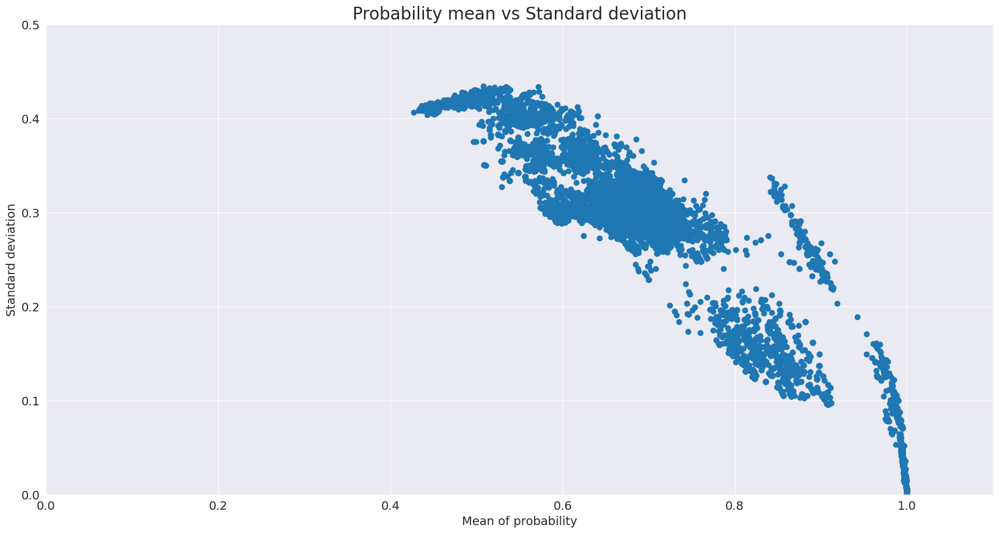

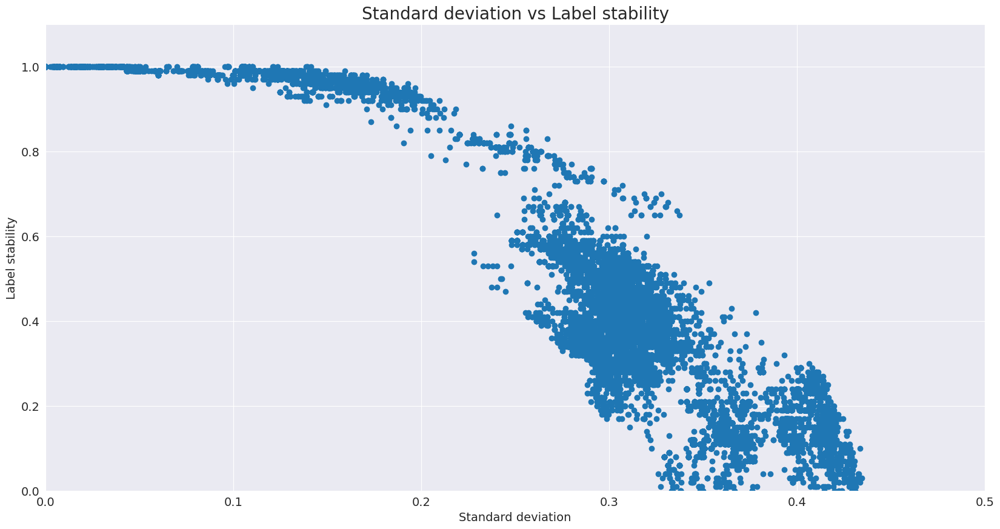

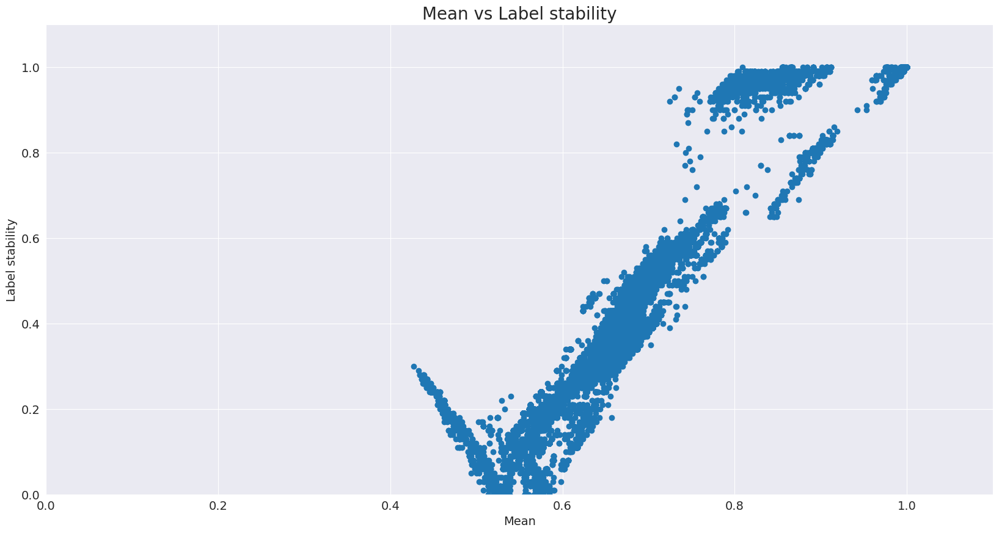

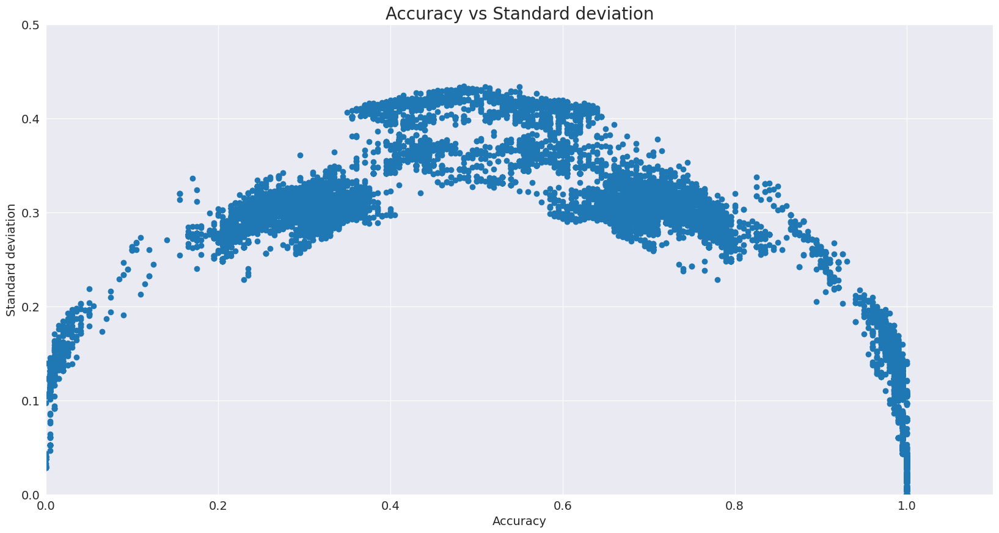

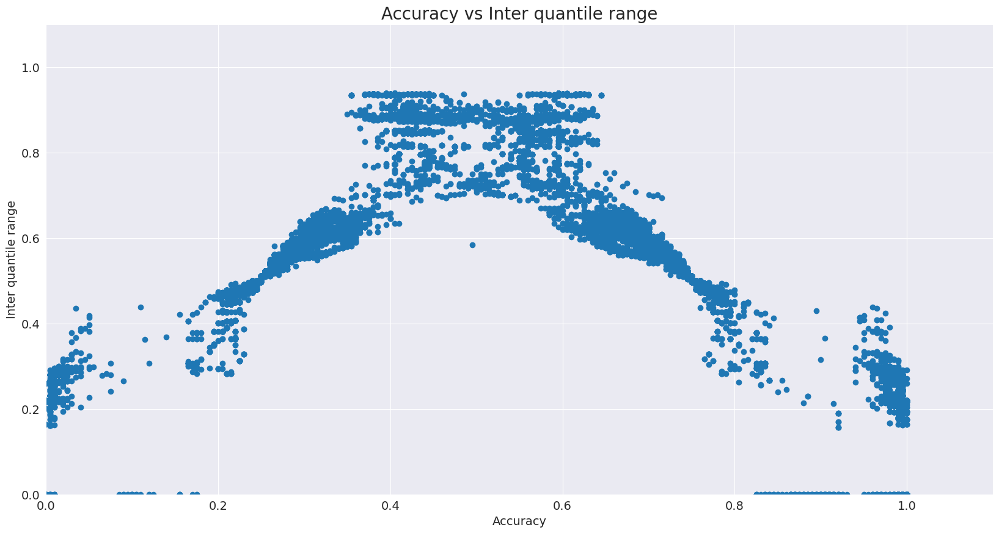

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.518741  0.502994  0.485149
disadv    0.584882  0.555163  0.563174
Accuracy -0.066141 -0.052168 -0.078026

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.023842  0.024795  0.031920
disadv            0.001652  0.012771  0.001926
Disparate_Impact  0.069298  0.515077  0.060340

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.015111  0.015940  0.019835
disadv             0.001990  0.008384  0.001765
Equal_Opportunity  0.013121  0.007556  0.018070

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.050548  0.050835  0.063473
disadv             

In [51]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-mean-conditional_SEX')

### Impute-by-mean-conditional_RAC1P technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


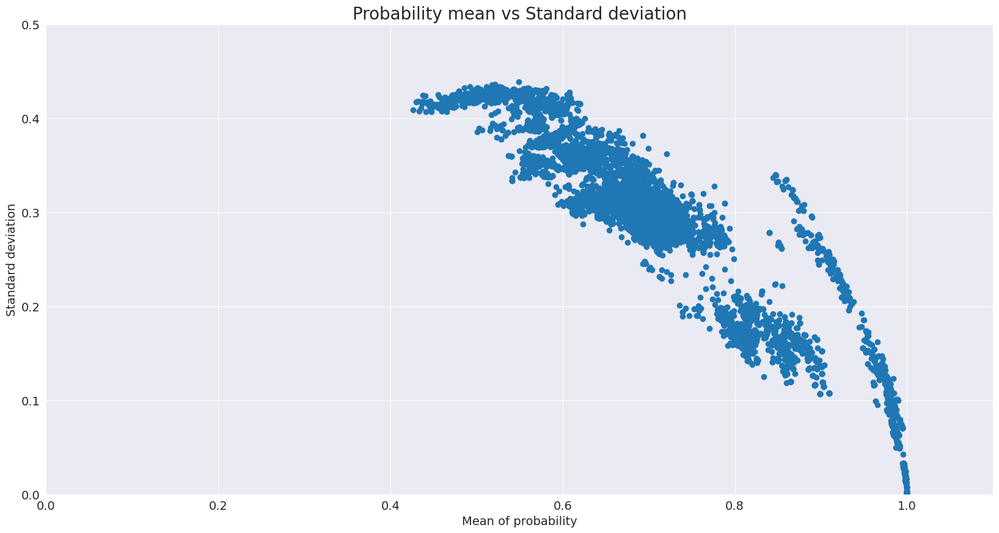

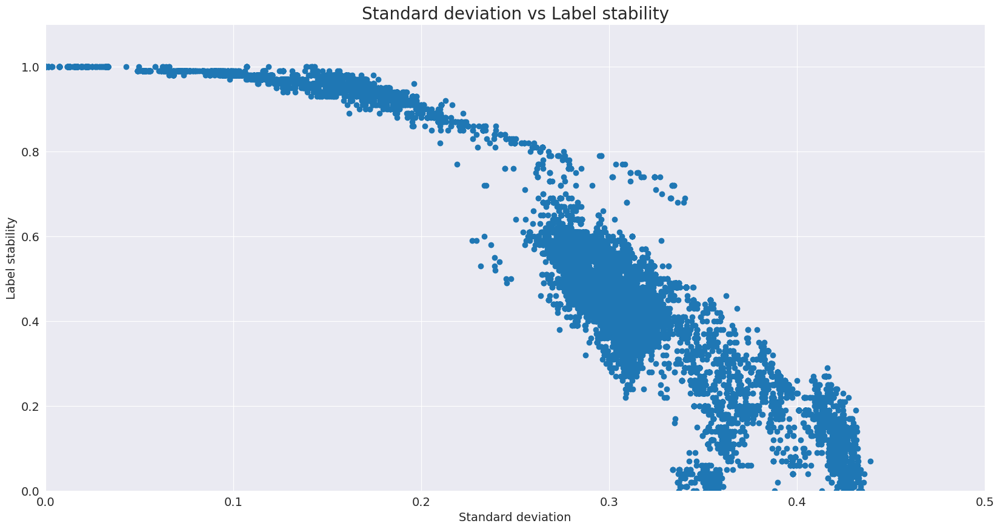

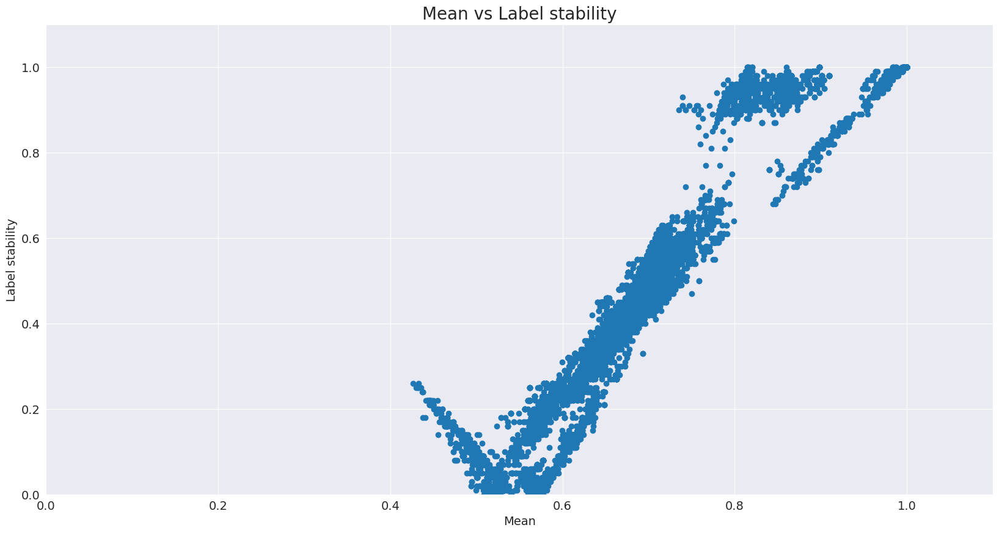

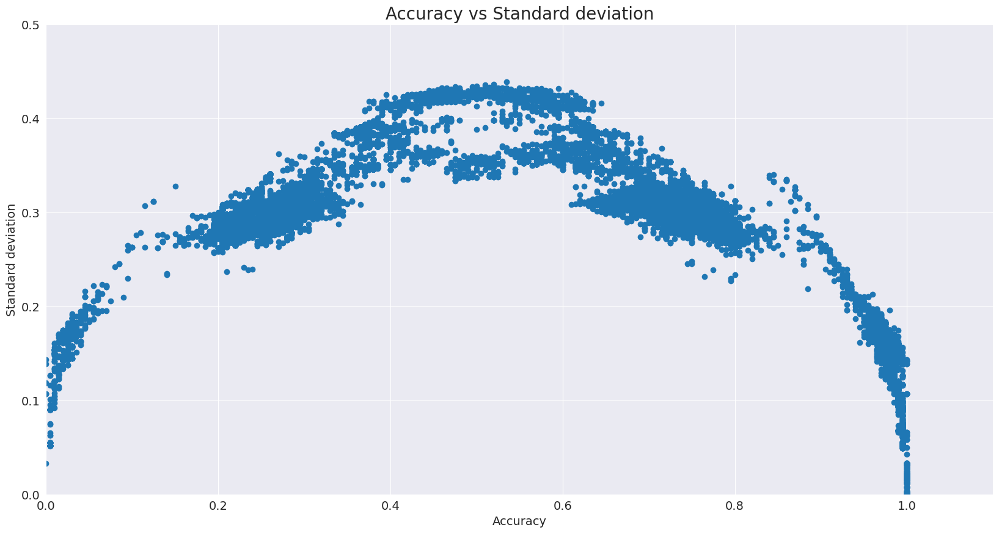

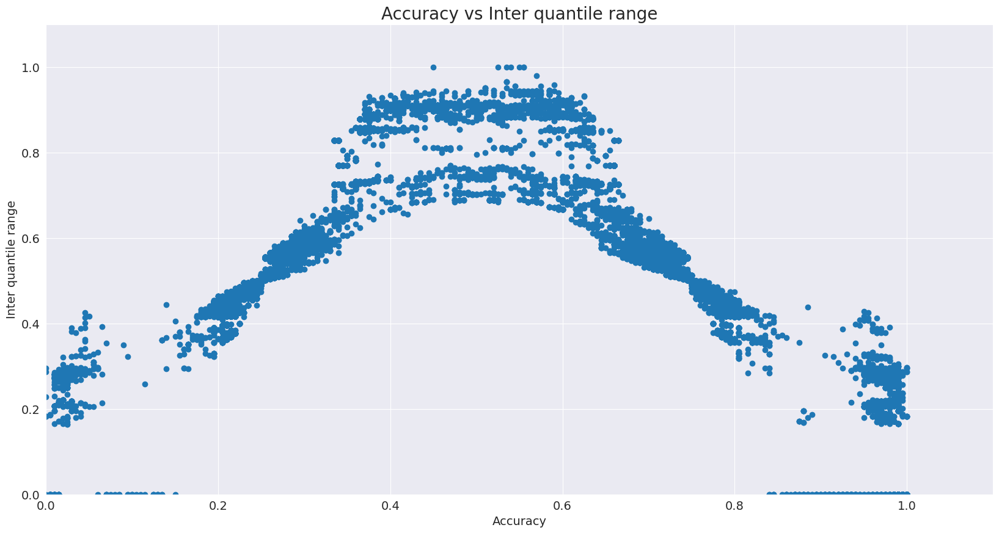

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.524059  0.509508  0.494311
disadv    0.584263  0.555949  0.562789
Accuracy -0.060203 -0.046440 -0.068478

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.012590  0.010927  0.012709
disadv            0.002272  0.010807  0.003082
Disparate_Impact  0.180437  0.989008  0.242484

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.008821  0.008401  0.009844
disadv             0.001990  0.007042  0.002648
Equal_Opportunity  0.006831  0.001358  0.007196

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.026693  0.022402  0.025272
disadv             

In [52]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-mean-conditional_RAC1P')

### Impute-by-median technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


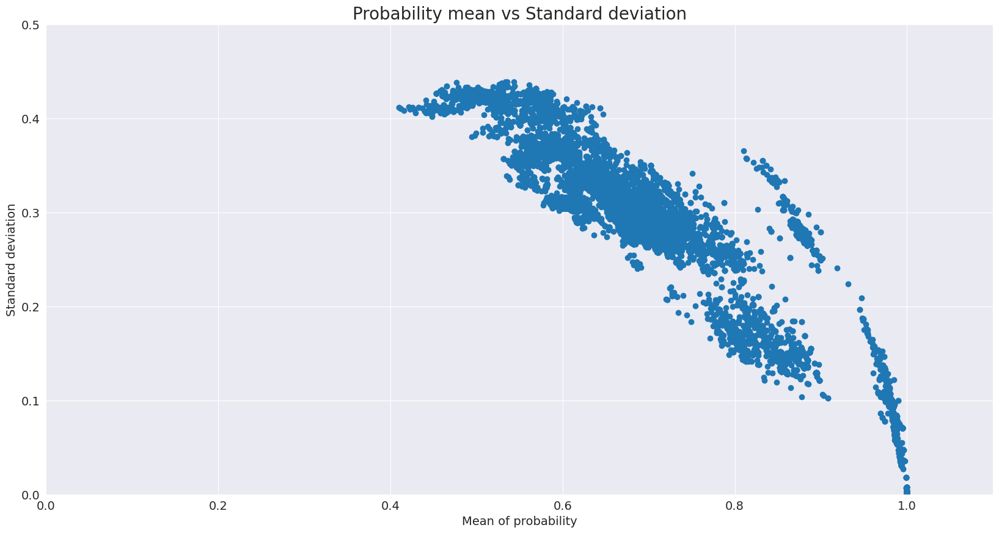

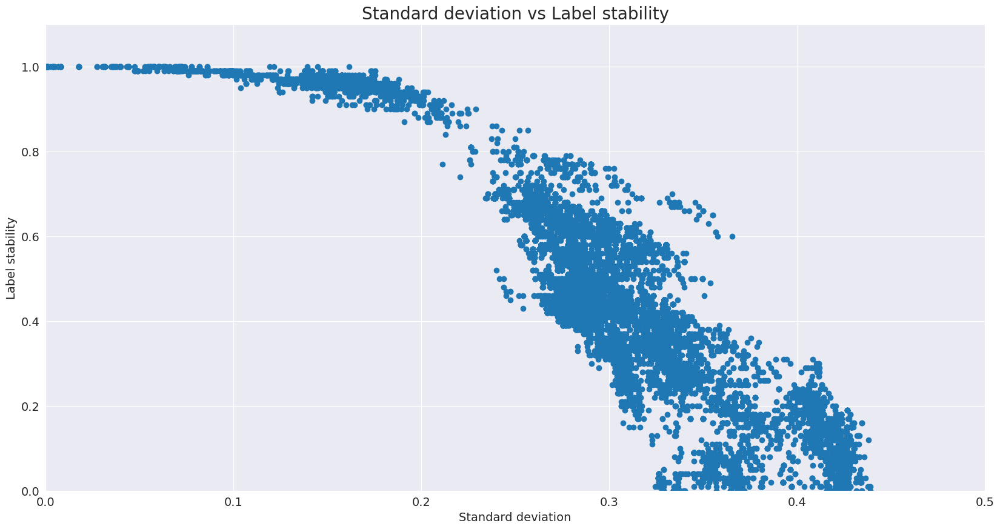

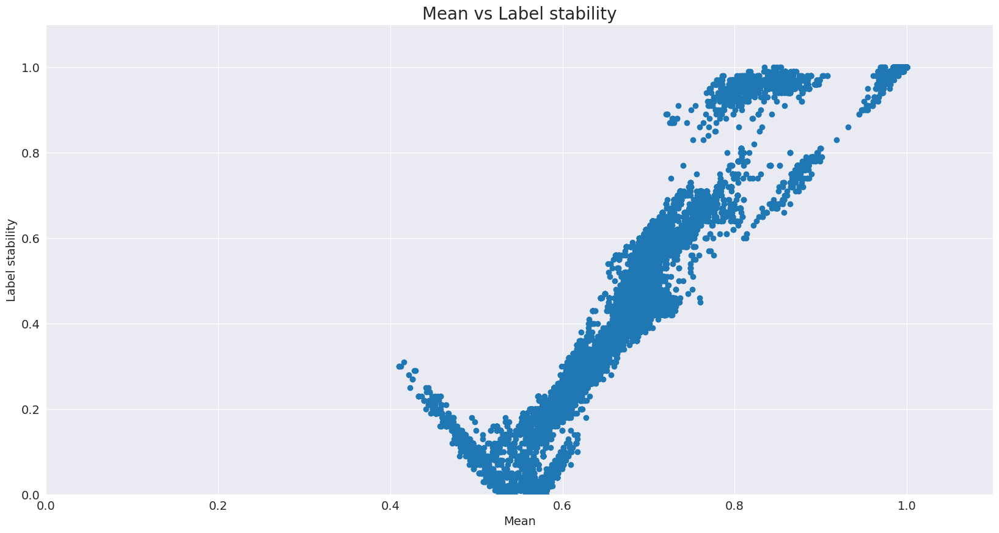

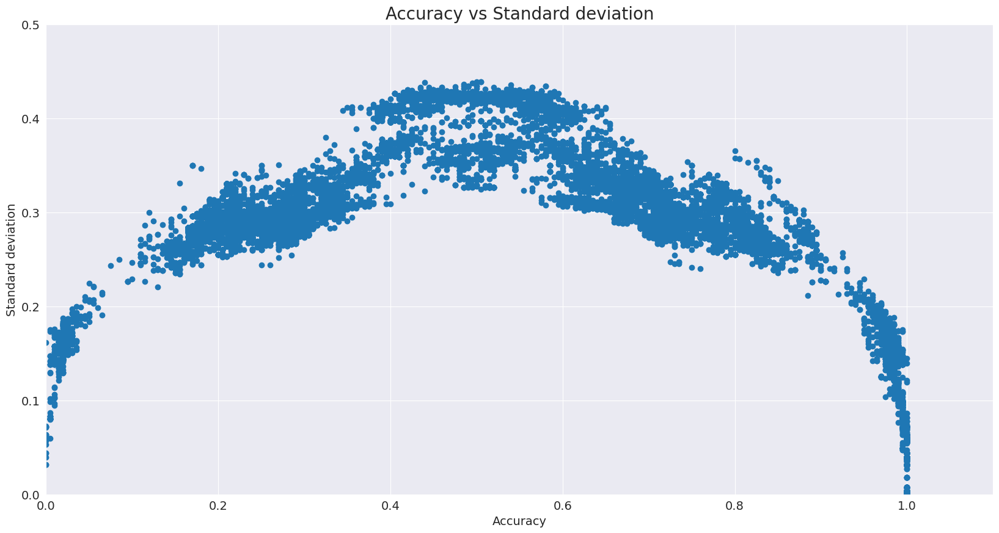

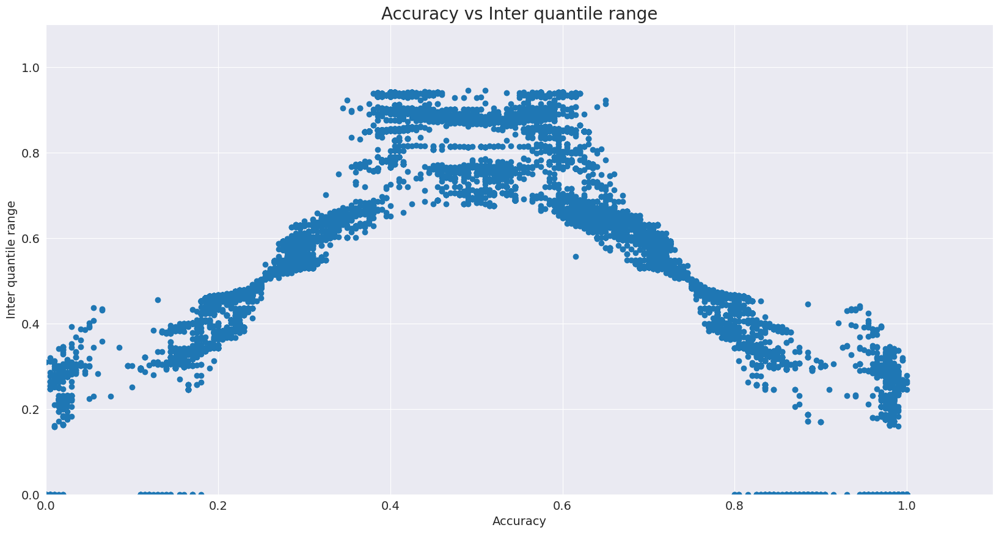

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.522648  0.506041  0.489803
disadv    0.582610  0.557324  0.562789
Accuracy -0.059962 -0.051283 -0.072985

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.015738  0.017756  0.021649
disadv            0.005576  0.009038  0.005393
Disparate_Impact  0.354314  0.509028  0.249105

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.010662  0.011847  0.014252
disadv             0.003980  0.006595  0.005296
Equal_Opportunity  0.006682  0.005252  0.008956

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.033367  0.036403  0.043050
disadv             

In [53]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median')

### Impute-by-median-trimmed technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


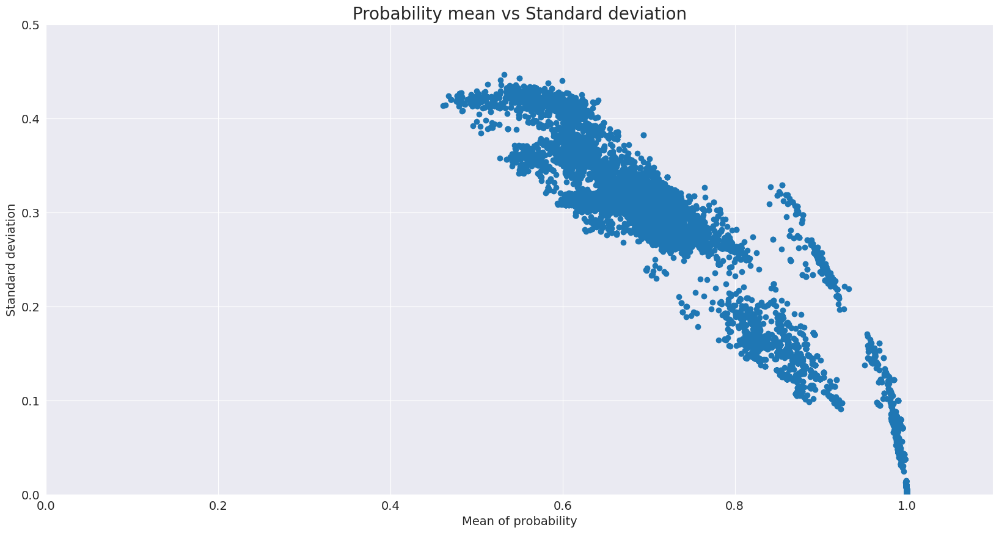

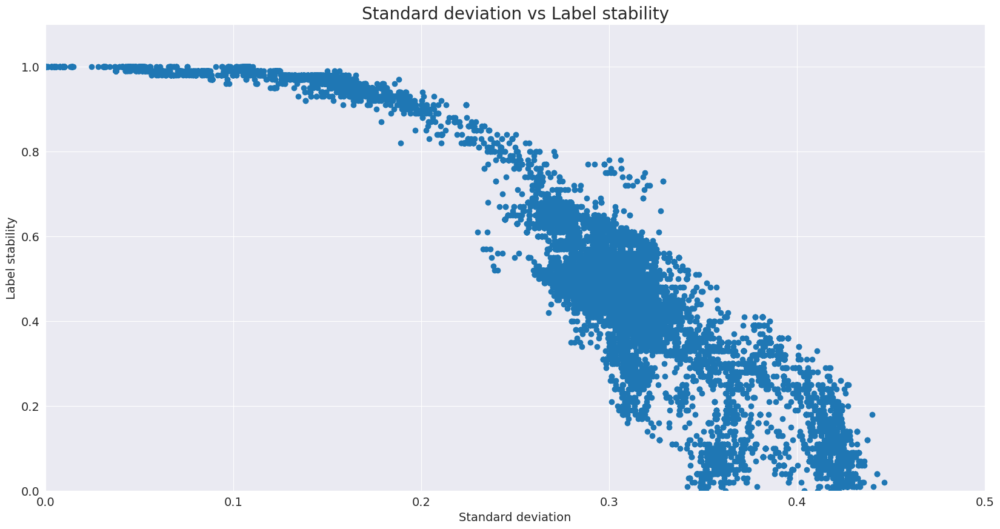

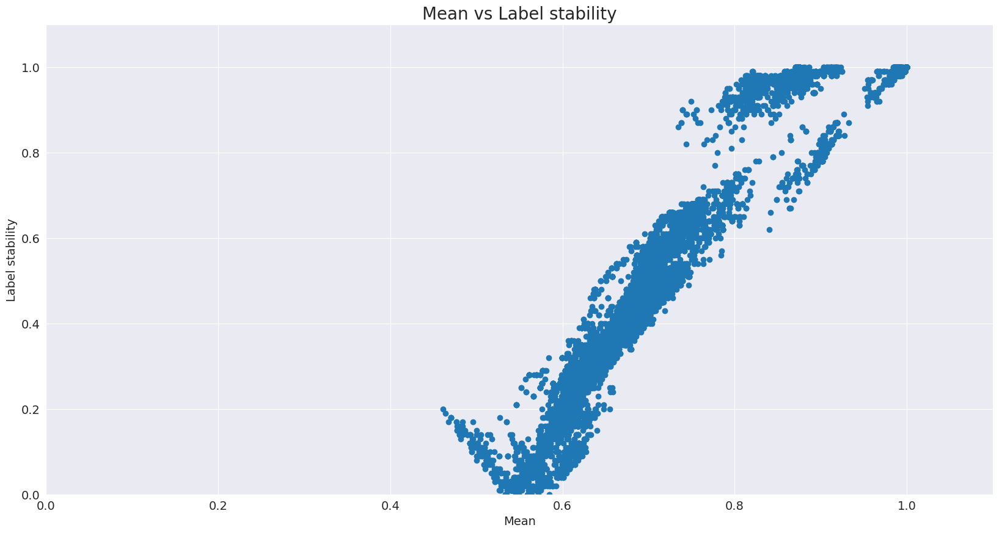

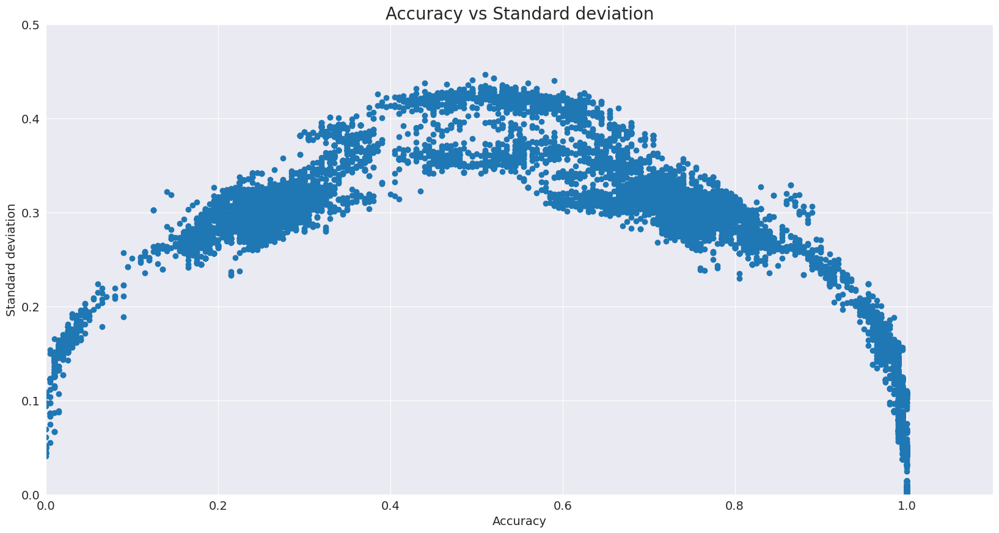

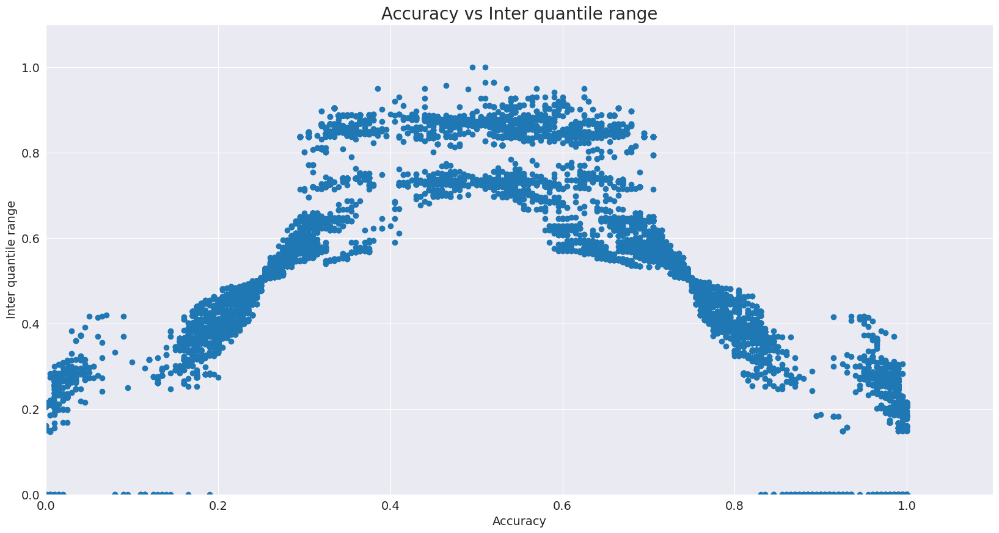

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.527786  0.511767  0.496675
disadv    0.584882  0.560026  0.563559
Accuracy -0.057096 -0.048258 -0.066884

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.000977  0.001418  0.000887
disadv            0.000000  0.001326  0.000000
Disparate_Impact  0.000000  0.935062  0.000000

#################### Equal_Opportunity ####################
                      Race       Sex  Race_Sex
adv                0.00046  0.000969  0.000441
disadv             0.00000  0.000894  0.000000
Equal_Opportunity  0.00046  0.000075  0.000441

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.002071  0.002908  0.001763
disadv                 

In [54]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median-trimmed')

### Impute-by-median-conditional_SEX technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


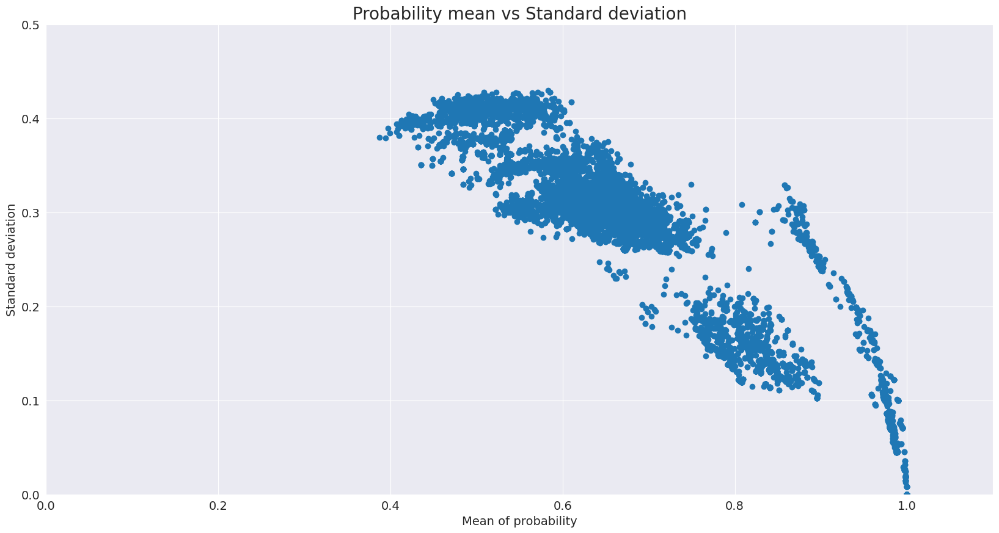

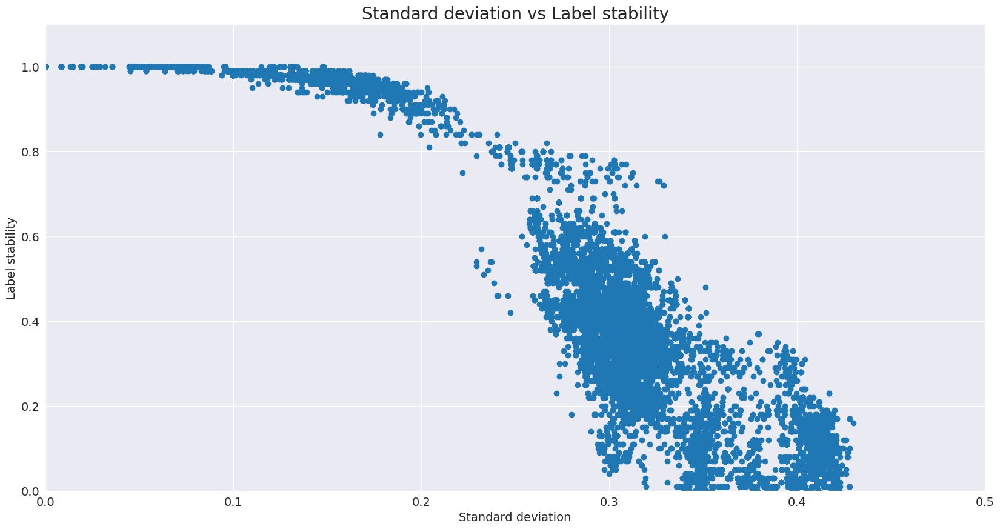

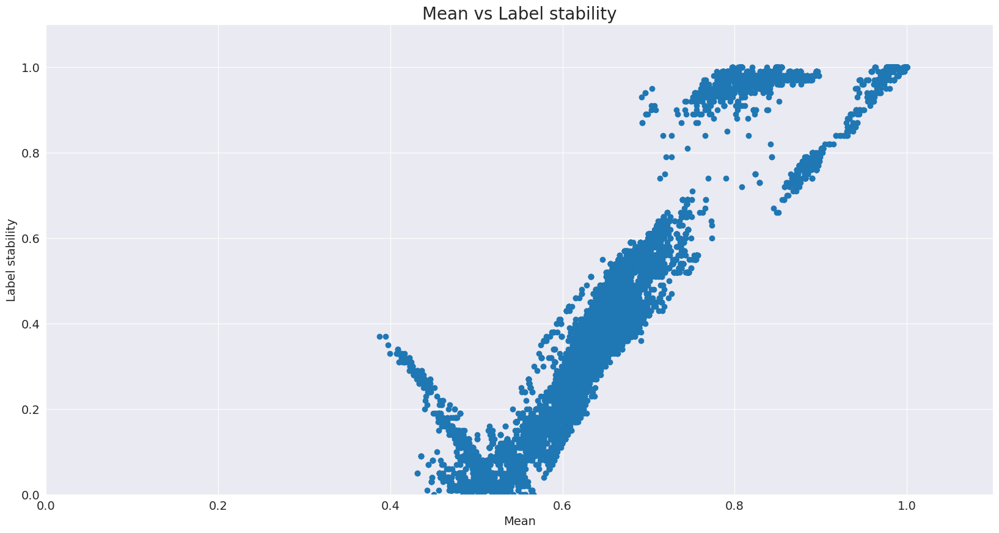

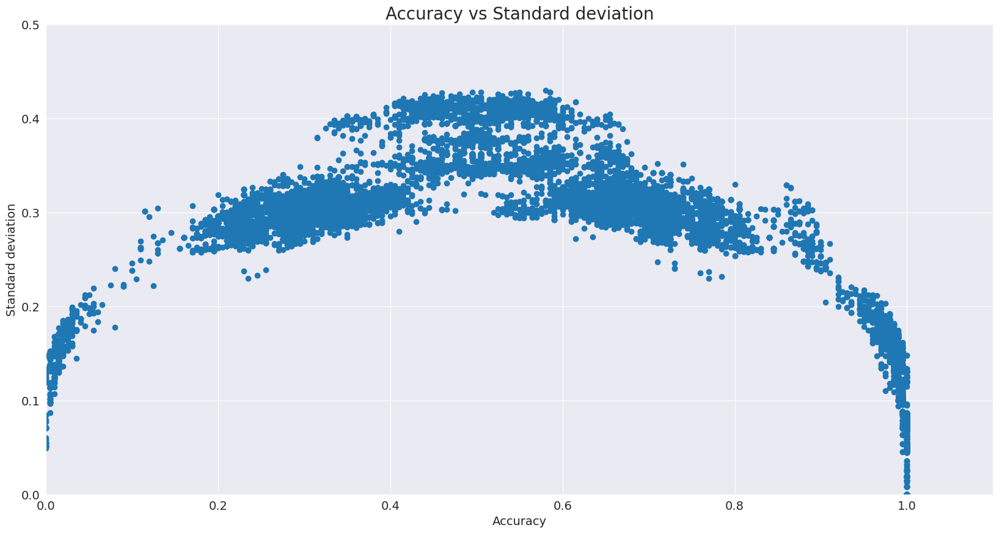

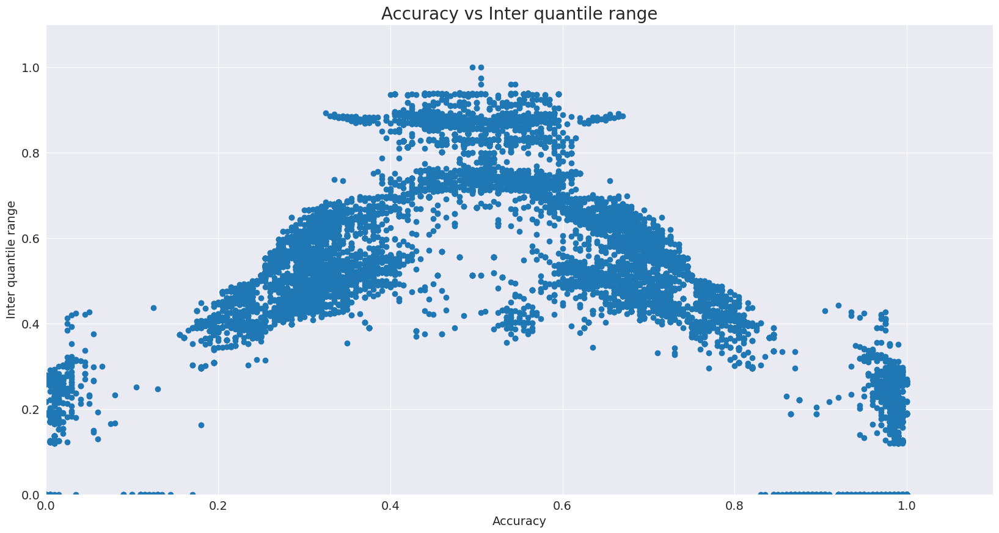

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.519863  0.514656  0.489065
disadv    0.592524  0.555605  0.567026
Accuracy -0.072661 -0.040948 -0.077962

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.027569  0.045493  0.035540
disadv            0.040273  0.024904  0.027350
Disparate_Impact  1.460807  0.547433  0.769546

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.020250  0.049111  0.027329
disadv             0.057711  0.022692  0.035305
Equal_Opportunity -0.037461  0.026420 -0.007976

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.058449  0.093269  0.070673
disadv             

In [55]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median-conditional_SEX')

### Impute-by-median-conditional_RAC1P technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


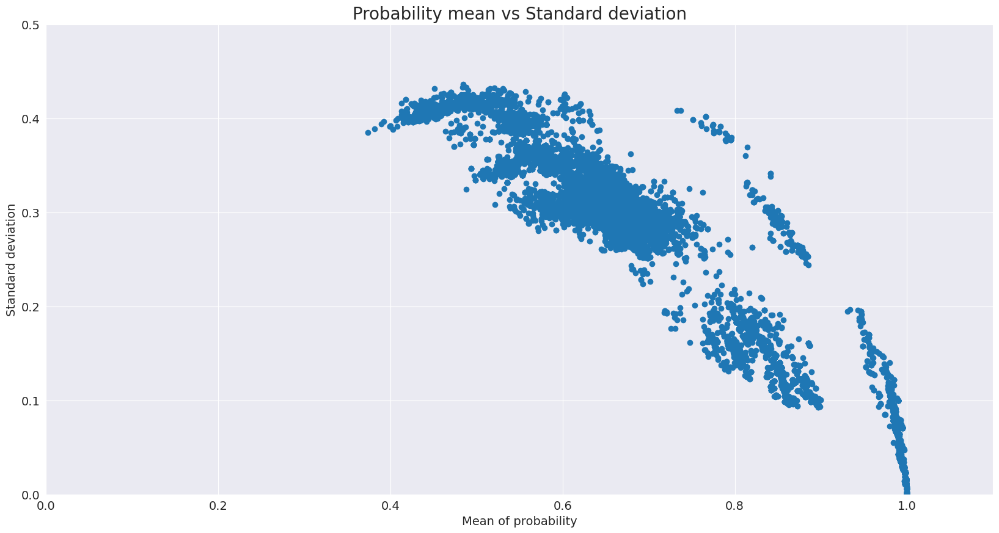

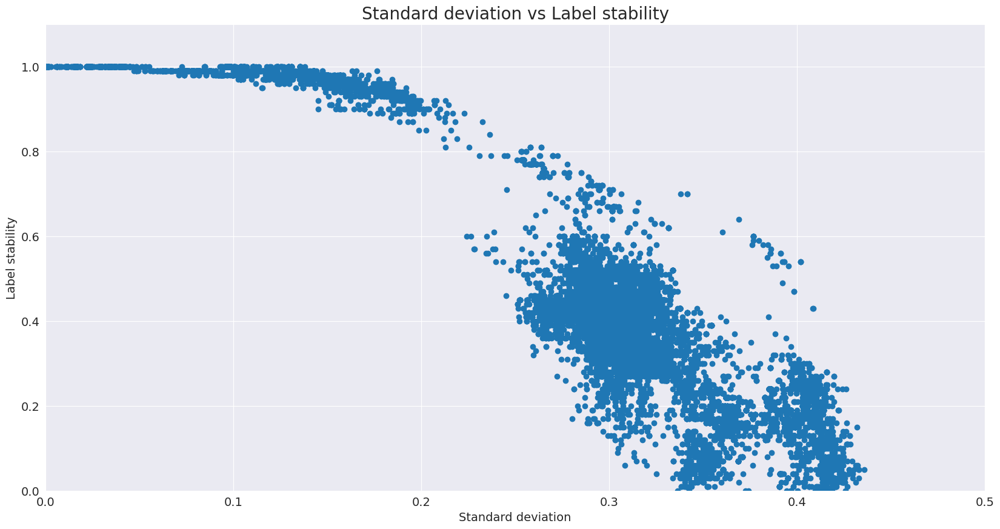

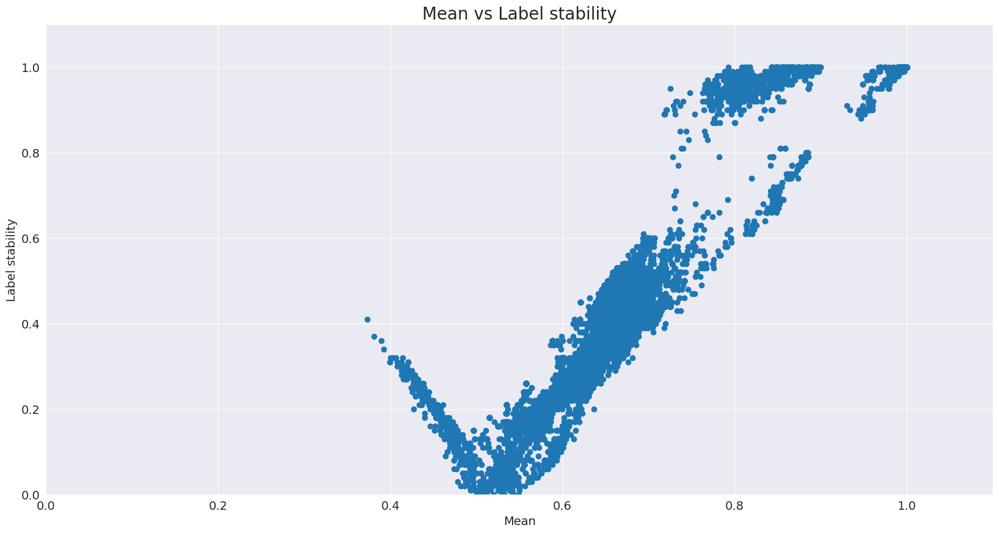

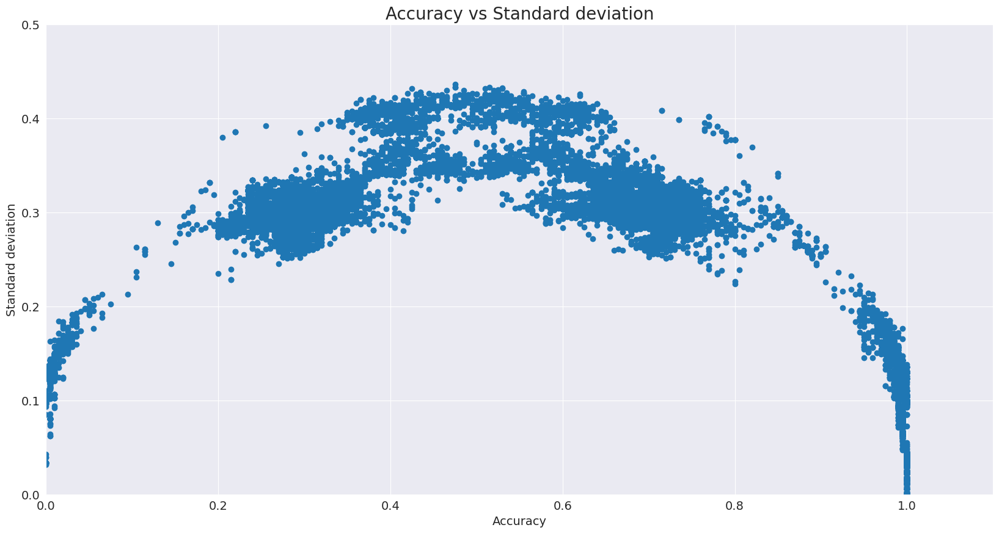

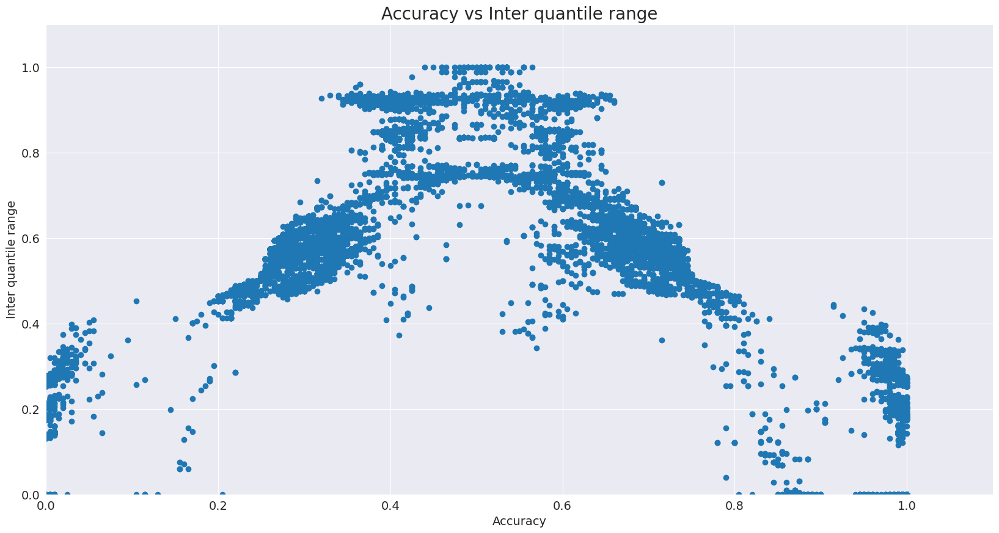

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.513205  0.498739  0.479902
disadv    0.582404  0.550251  0.561248
Accuracy -0.069198 -0.051511 -0.081346

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.031476  0.031782  0.040121
disadv            0.009087  0.019452  0.009245
Disparate_Impact  0.288700  0.612041  0.230427

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.017335  0.018740  0.022774
disadv             0.007960  0.010396  0.007944
Equal_Opportunity  0.009375  0.008344  0.014831

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.066733  0.065159  0.079783
disadv             

In [56]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median-conditional_RAC1P')

## Display result plots

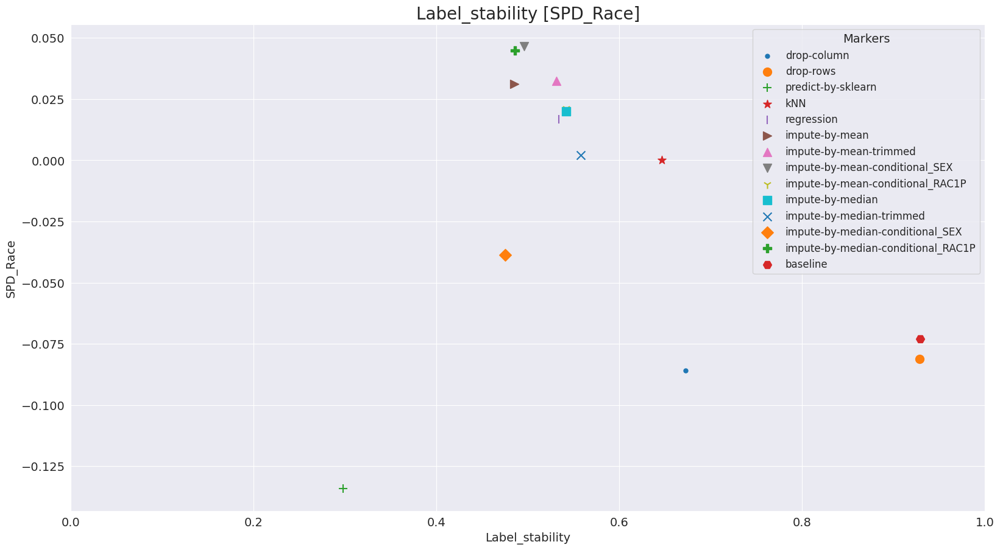

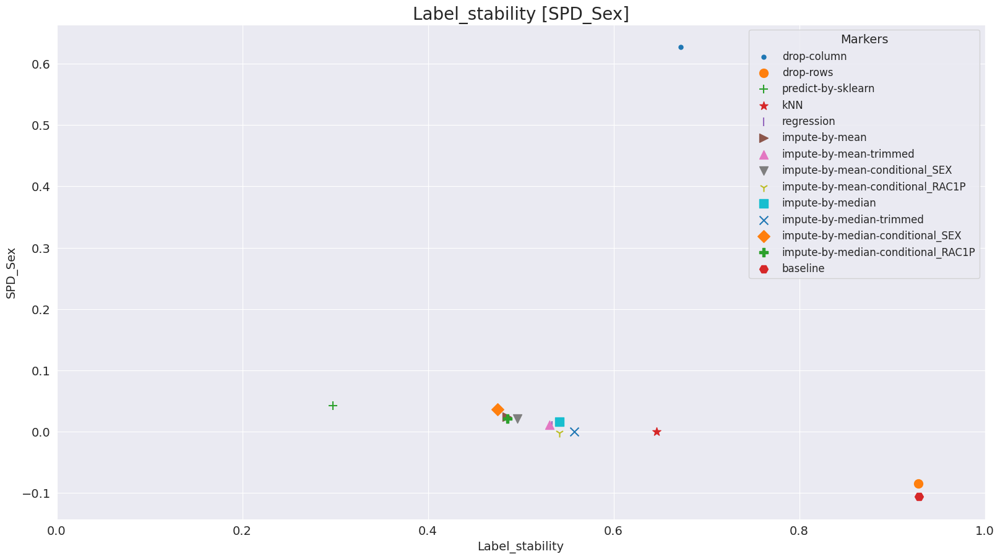

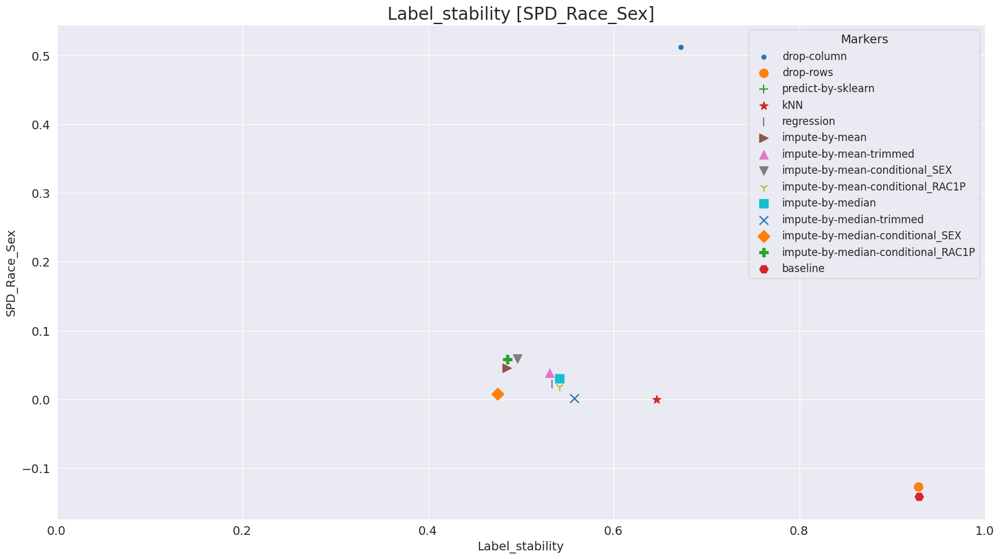

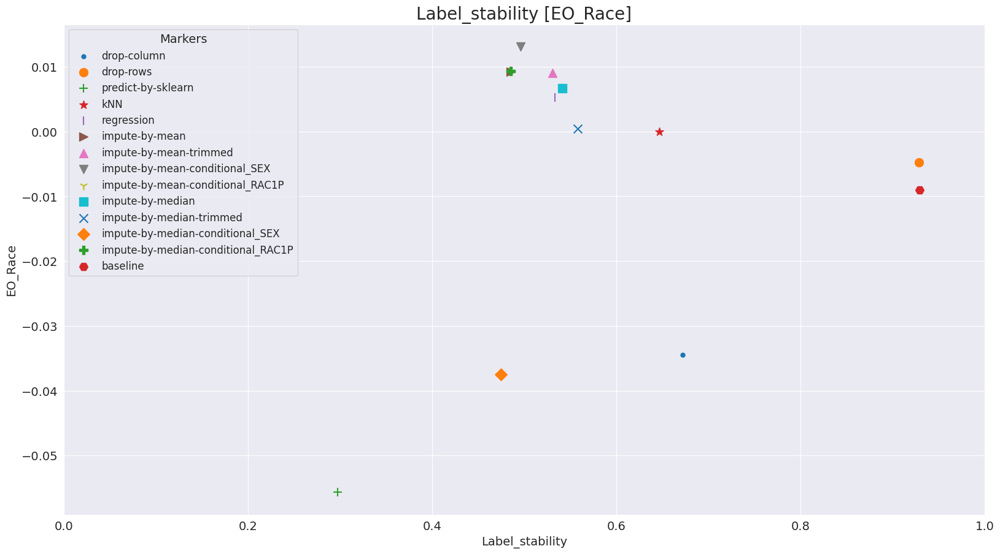

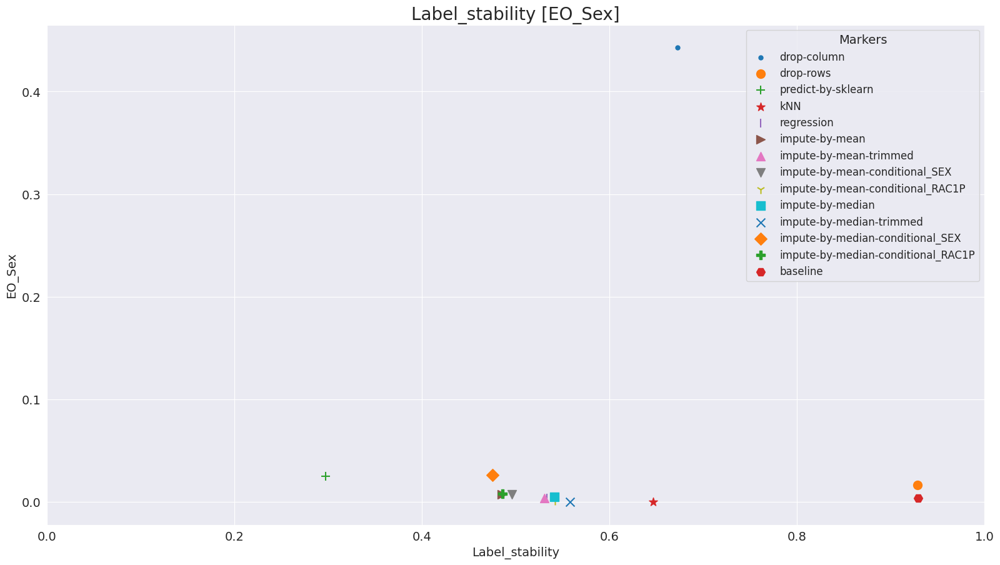

...

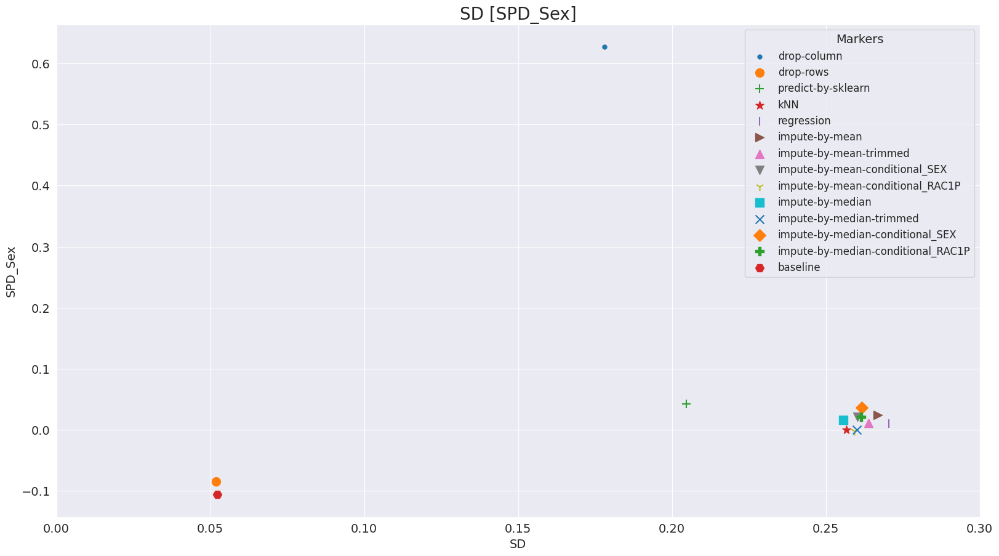

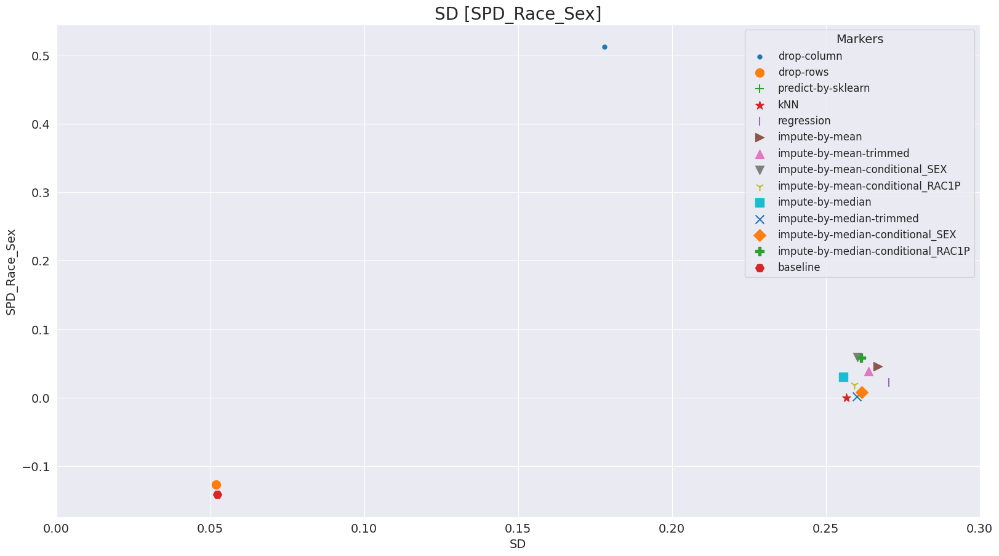

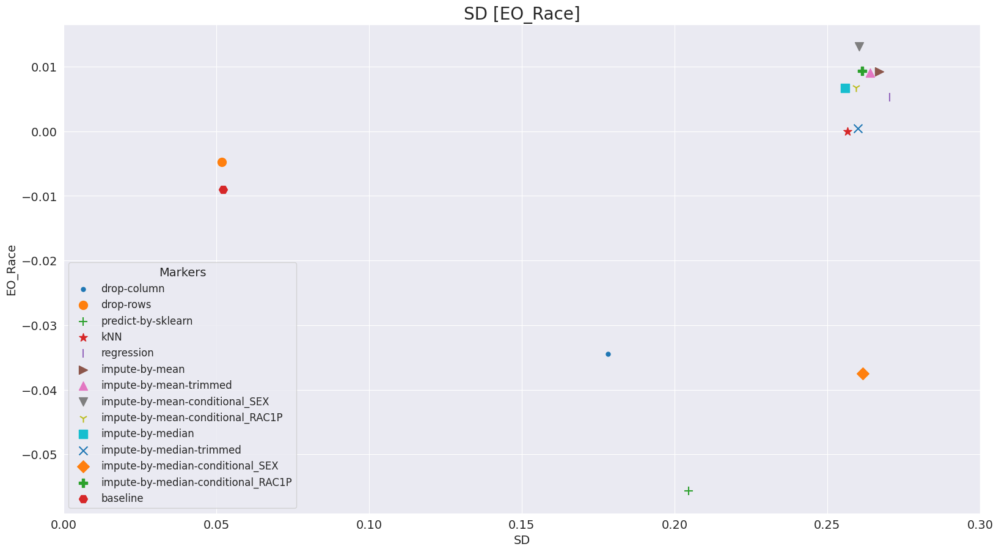

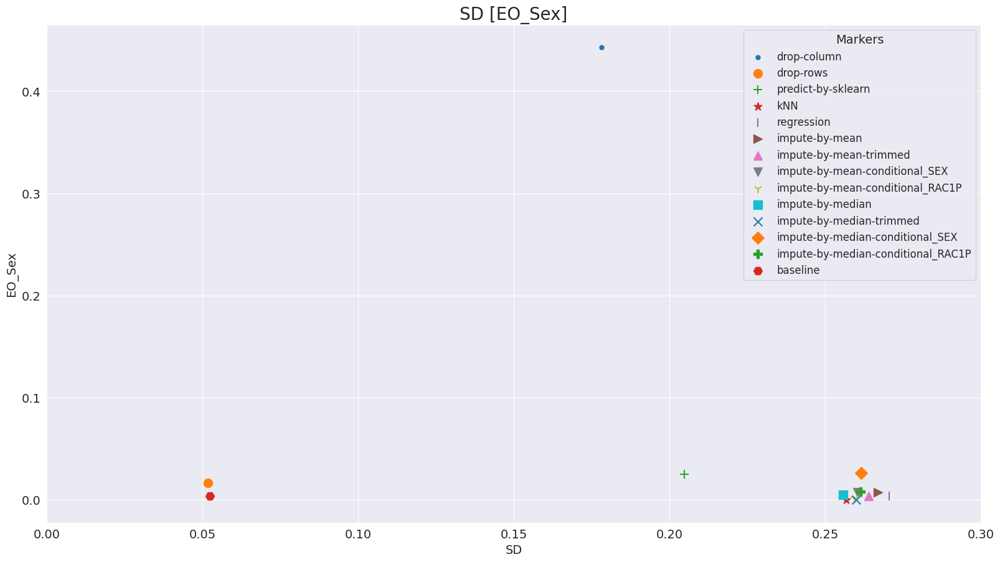

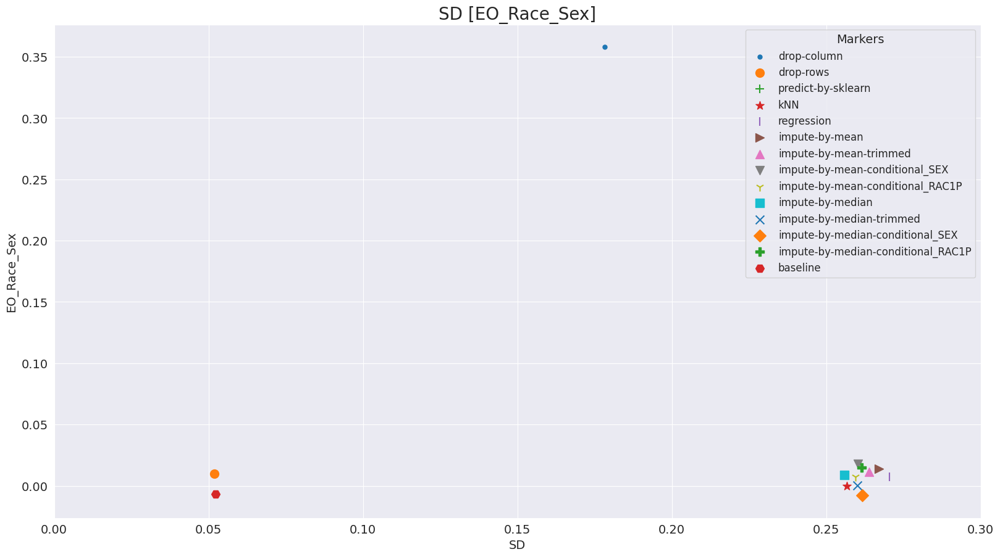

In [57]:
display_result_plots(NULL_SCENARIO_NAME, imputation_techniques)